# Deep Convolutional GANs

In this notebook, you'll build a GAN using convolutional layers in the generator and discriminator. This is called a Deep Convolutional GAN, or DCGAN for short. The DCGAN architecture was first explored last year and has seen impressive results in generating new images, you can read the [original paper here](https://arxiv.org/pdf/1511.06434.pdf).

You'll be training DCGAN on the [Street View House Numbers](http://ufldl.stanford.edu/housenumbers/) (SVHN) dataset. These are color images of house numbers collected from Google street view. SVHN images are in color and much more variable than MNIST. 

![SVHN Examples](assets/SVHN_examples.png)

So, we'll need a deeper and more powerful network. This is accomplished through using convolutional layers in the discriminator and generator. It's also necessary to use batch normalization to get the convolutional networks to train. The only real changes compared to what [you saw previously](https://github.com/udacity/deep-learning/tree/master/gan_mnist) are in the generator and discriminator, otherwise the rest of the implementation is the same.

In [1]:
%matplotlib inline

import pickle as pkl

import matplotlib.pyplot as plt
import numpy as np
from scipy.io import loadmat
import tensorflow as tf

In [2]:
!mkdir data

mkdir: cannot create directory 'data': File exists


## Getting the data

Here you can download the SVHN dataset. Run the cell above and it'll download to your machine.

In [3]:
from urllib.request import urlretrieve
from os.path import isfile, isdir
from tqdm import tqdm

data_dir = 'data/'

if not isdir(data_dir):
    raise Exception("Data directory doesn't exist!")

class DLProgress(tqdm):
    last_block = 0

    def hook(self, block_num=1, block_size=1, total_size=None):
        self.total = total_size
        self.update((block_num - self.last_block) * block_size)
        self.last_block = block_num

if not isfile(data_dir + "train_32x32.mat"):
    with DLProgress(unit='B', unit_scale=True, miniters=1, desc='SVHN Training Set') as pbar:
        urlretrieve(
            'http://ufldl.stanford.edu/housenumbers/train_32x32.mat',
            data_dir + 'train_32x32.mat',
            pbar.hook)

if not isfile(data_dir + "test_32x32.mat"):
    with DLProgress(unit='B', unit_scale=True, miniters=1, desc='SVHN Testing Set') as pbar:
        urlretrieve(
            'http://ufldl.stanford.edu/housenumbers/test_32x32.mat',
            data_dir + 'test_32x32.mat',
            pbar.hook)

SVHN Training Set: 182MB [00:37, 4.87MB/s]                              
SVHN Testing Set: 64.3MB [00:14, 4.41MB/s]                              


These SVHN files are `.mat` files typically used with Matlab. However, we can load them in with `scipy.io.loadmat` which we imported above.

In [4]:
trainset = loadmat(data_dir + 'train_32x32.mat')
testset = loadmat(data_dir + 'test_32x32.mat')

Here I'm showing a small sample of the images. Each of these is 32x32 with 3 color channels (RGB). These are the real images we'll pass to the discriminator and what the generator will eventually fake.

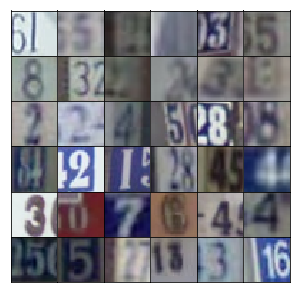

In [5]:
idx = np.random.randint(0, trainset['X'].shape[3], size=36)
fig, axes = plt.subplots(6, 6, sharex=True, sharey=True, figsize=(5,5),)
for ii, ax in zip(idx, axes.flatten()):
    ax.imshow(trainset['X'][:,:,:,ii], aspect='equal')
    ax.xaxis.set_visible(False)
    ax.yaxis.set_visible(False)
plt.subplots_adjust(wspace=0, hspace=0)

Here we need to do a bit of preprocessing and getting the images into a form where we can pass batches to the network. First off, we need to rescale the images to a range of -1 to 1, since the output of our generator is also in that range. We also have a set of test and validation images which could be used if we're trying to identify the numbers in the images.

In [6]:
def scale(x, feature_range=(-1, 1)):
    # scale to (0, 1)
    x = ((x - x.min())/(255 - x.min()))
    
    # scale to feature_range
    min, max = feature_range
    x = x * (max - min) + min
    return x

In [7]:
class Dataset:
    def __init__(self, train, test, val_frac=0.5, shuffle=False, scale_func=None):
        split_idx = int(len(test['y'])*(1 - val_frac))
        self.test_x, self.valid_x = test['X'][:,:,:,:split_idx], test['X'][:,:,:,split_idx:]
        self.test_y, self.valid_y = test['y'][:split_idx], test['y'][split_idx:]
        self.train_x, self.train_y = train['X'], train['y']
        
        self.train_x = np.rollaxis(self.train_x, 3)
        self.valid_x = np.rollaxis(self.valid_x, 3)
        self.test_x = np.rollaxis(self.test_x, 3)
        
        if scale_func is None:
            self.scaler = scale
        else:
            self.scaler = scale_func
        self.shuffle = shuffle
        
    def batches(self, batch_size):
        if self.shuffle:
            idx = np.arange(len(dataset.train_x))
            np.random.shuffle(idx)
            self.train_x = self.train_x[idx]
            self.train_y = self.train_y[idx]
        
        n_batches = len(self.train_y)//batch_size
        for ii in range(0, len(self.train_y), batch_size):
            x = self.train_x[ii:ii+batch_size]
            y = self.train_y[ii:ii+batch_size]
            
            yield self.scaler(x), y

## Network Inputs

Here, just creating some placeholders like normal.

In [8]:
def model_inputs(real_dim, z_dim):
    inputs_real = tf.placeholder(tf.float32, (None, *real_dim), name='input_real')
    inputs_z = tf.placeholder(tf.float32, (None, z_dim), name='input_z')
    
    return inputs_real, inputs_z

## Generator

Here you'll build the generator network. The input will be our noise vector `z` as before. Also as before, the output will be a $tanh$ output, but this time with size 32x32 which is the size of our SVHN images.

What's new here is we'll use convolutional layers to create our new images. The first layer is a fully connected layer which is reshaped into a deep and narrow layer, something like 4x4x1024 as in the original DCGAN paper. Then we use batch normalization and a leaky ReLU activation. Next is a transposed convolution where typically you'd halve the depth and double the width and height of the previous layer. Again, we use batch normalization and leaky ReLU. For each of these layers, the general scheme is convolution > batch norm > leaky ReLU.

You keep stacking layers up like this until you get the final transposed convolution layer with shape 32x32x3. Below is the archicture used in the original DCGAN paper:

![DCGAN Generator](assets/dcgan.png)

Note that the final layer here is 64x64x3, while for our SVHN dataset, we only want it to be 32x32x3. 

>**Exercise:** Build the transposed convolutional network for the generator in the function below. Be sure to use leaky ReLUs on all the layers except for the last tanh layer, as well as batch normalization on all the transposed convolutional layers except the last one.

In [9]:
def generator(z, output_dim, reuse=False, alpha=0.2, training=True):
    with tf.variable_scope('generator', reuse=reuse):
        # First fully connected layer
        x1 = tf.contrib.layers.fully_connected(z,512*4*4,activation_fn=None)
        x1 = tf.layers.batch_normalization(x1,training=training)
        x1 = tf.maximum(alpha*x1,x1)
        ## shape (BATCH_SIZE,512*4*4)
        
        ## Now reshaping it to [4,4,512]
        x2 = tf.reshape(x1,[-1,4,4,512]) ## -1 IS TO HANDEL THE BATCH SIZE
        
        ## Now reshaping it to [8,8,256]
        x2=tf.layers.conv2d_transpose(x2,filters=256,kernel_size=5,strides=2,padding="same",
                                    use_bias=False)
        x2 = tf.layers.batch_normalization(x2,training=training)
        x2 = tf.maximum(alpha*x2,x2)
        
        
        #Now reshaping it to [16,16,128]
        x3 = tf.layers.conv2d_transpose(x2,filters=128,kernel_size=5,strides=2,
                                       padding="same",use_bias=False)
        x3 = tf.layers.batch_normalization(x3,training=training)
        x3 = tf.maximum(alpha*x3,x3)
        
        ## Now reshaping it to [32,32,3]
        ## out_dims = 3 for color channels.
        x4 = tf.layers.conv2d_transpose(x3,filters=output_dim,kernel_size=5,strides=2,
                                       padding="same",use_bias=False)

        
        
        
        # Output layer, 32x32x3
        logits = x4
        
        out = tf.tanh(logits)
        
        return out

## Discriminator

Here you'll build the discriminator. This is basically just a convolutional classifier like you've built before. The input to the discriminator are 32x32x3 tensors/images. You'll want a few convolutional layers, then a fully connected layer for the output. As before, we want a sigmoid output, and you'll need to return the logits as well. For the depths of the convolutional layers I suggest starting with 16, 32, 64 filters in the first layer, then double the depth as you add layers. Note that in the DCGAN paper, they did all the downsampling using only strided convolutional layers with no maxpool layers.

You'll also want to use batch normalization with `tf.layers.batch_normalization` on each layer except the first convolutional and output layers. Again, each layer should look something like convolution > batch norm > leaky ReLU.

Note: in this project, your batch normalization layers will always use batch statistics. (That is, always set `training` to `True`.) That's because we are only interested in using the discriminator to help train the generator. However, if you wanted to use the discriminator for inference later, then you would need to set the `training` parameter appropriately.

>**Exercise:** Build the convolutional network for the discriminator. The input is a 32x32x3 images, the output is a sigmoid plus the logits. Again, use Leaky ReLU activations and batch normalization on all the layers except the first.

In [10]:
def discriminator(x, reuse=False, alpha=0.2):
    with tf.variable_scope('discriminator', reuse=reuse):
        # Input layer is 32x32x3
        x1 = tf.layers.conv2d(x,filters=64,kernel_size=5,strides=2,
                            padding="same")
        ## No batch normalization on the  first layer
        x1 = tf.maximum(alpha*x1,x1)
        ## the ouptut shape (16,16,64)
        x2 = tf.layers.conv2d(x1,filters=128,kernel_size=5,strides=2,
                             padding="same",use_bias=False)
        x2 = tf.layers.batch_normalization(x2)
        ## we don't need descriminator for inference its only for adversarial optimization
        x2 = tf.maximum(alpha*x2,x2)
        ## the ouput shape is (8,8,128)
        
        x3 = tf.layers.conv2d(x2,filters=256,kernel_size=5,strides=2,
                             padding="same",use_bias=False)
        x3 = tf.layers.batch_normalization(x3)
        x3 = tf.maximum(alpha*x3,x3)
        ## the output shape is (4,4,256)
        shape = x.get_shape()
        
        x3_flattened = tf.reshape(x3,[-1,4*4*256])
        ## -1 is to handle the batch size
        
        x4 = tf.contrib.layers.fully_connected(x3_flattened,1,
                                               activation_fn=None) 
        
        logits = x4
        out = tf.nn.sigmoid(x4)
        
        return out, logits

## Model Loss

Calculating the loss like before, nothing new here.

In [11]:
def model_loss(input_real, input_z, output_dim, alpha=0.2):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    g_model = generator(input_z, output_dim, alpha=alpha)
    d_model_real, d_logits_real = discriminator(input_real, alpha=alpha)
    d_model_fake, d_logits_fake = discriminator(g_model, reuse=True, alpha=alpha)

    d_loss_real = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_real, labels=tf.ones_like(d_model_real)))
    d_loss_fake = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.zeros_like(d_model_fake)))
    g_loss = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.ones_like(d_model_fake)))

    d_loss = d_loss_real + d_loss_fake

    return d_loss, g_loss

## Optimizers

Not much new here, but notice how the train operations are wrapped in a `with tf.control_dependencies` block so the batch normalization layers can update their population statistics.

In [12]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    # Get weights and bias to update
    t_vars = tf.trainable_variables()
    d_vars = [var for var in t_vars if var.name.startswith('discriminator')]
    g_vars = [var for var in t_vars if var.name.startswith('generator')]

    # Optimize
    with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS)):
        d_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(d_loss, var_list=d_vars)
        g_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(g_loss, var_list=g_vars)

    return d_train_opt, g_train_opt

## Building the model

Here we can use the functions we defined about to build the model as a class. This will make it easier to move the network around in our code since the nodes and operations in the graph are packaged in one object.

In [13]:
class GAN:
    def __init__(self, real_size, z_size, learning_rate, alpha=0.2, beta1=0.5):
        tf.reset_default_graph()
        
        self.input_real, self.input_z = model_inputs(real_size, z_size)
        
        self.d_loss, self.g_loss = model_loss(self.input_real, self.input_z,
                                              real_size[2], alpha=alpha)
        
        self.d_opt, self.g_opt = model_opt(self.d_loss, self.g_loss, learning_rate, beta1)

Here is a function for displaying generated images.

In [14]:
def view_samples(epoch, samples, nrows, ncols, figsize=(5,5)):
    fig, axes = plt.subplots(figsize=figsize, nrows=nrows, ncols=ncols, 
                             sharey=True, sharex=True)
    for ax, img in zip(axes.flatten(), samples[epoch]):
        ax.axis('off')
        img = ((img - img.min())*255 / (img.max() - img.min())).astype(np.uint8)
        ax.set_adjustable('box-forced')
        im = ax.imshow(img, aspect='equal')
   
    plt.subplots_adjust(wspace=0, hspace=0)
    return fig, axes

And another function we can use to train our network. Notice when we call `generator` to create the samples to display, we set `training` to `False`. That's so the batch normalization layers will use the population statistics rather than the batch statistics. Also notice that we set the `net.input_real` placeholder when we run the generator's optimizer. The generator doesn't actually use it, but we'd get an error without it because of the `tf.control_dependencies` block we created in `model_opt`. 

In [15]:
def train(net, dataset, epochs, batch_size, print_every=10, show_every=100, figsize=(5,5)):
    saver = tf.train.Saver()
    sample_z = np.random.uniform(-1, 1, size=(72, z_size))

    samples, losses = [], []
    steps = 0

    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for e in range(epochs):
            for x, y in dataset.batches(batch_size):
                steps += 1

                # Sample random noise for G
                batch_z = np.random.uniform(-1, 1, size=(batch_size, z_size))

                # Run optimizers
                _ = sess.run(net.d_opt, feed_dict={net.input_real: x, net.input_z: batch_z})
                _ = sess.run(net.g_opt, feed_dict={net.input_z: batch_z, net.input_real: x})

                if steps % print_every == 0:
                    # At the end of each epoch, get the losses and print them out
                    train_loss_d = net.d_loss.eval({net.input_z: batch_z, net.input_real: x})
                    train_loss_g = net.g_loss.eval({net.input_z: batch_z})

                    print("Epoch {}/{}...".format(e+1, epochs),
                          "Discriminator Loss: {:.4f}...".format(train_loss_d),
                          "Generator Loss: {:.4f}".format(train_loss_g))
                    # Save losses to view after training
                    losses.append((train_loss_d, train_loss_g))

                if steps % show_every == 0:
                    gen_samples = sess.run(
                                   generator(net.input_z, 3, reuse=True, training=False),
                                   feed_dict={net.input_z: sample_z})
                    samples.append(gen_samples)
                    _ = view_samples(-1, samples, 6, 12, figsize=figsize)
                    plt.show()

        saver.save(sess, './checkpoints/generator.ckpt')

    with open('samples.pkl', 'wb') as f:
        pkl.dump(samples, f)
    
    return losses, samples

## Hyperparameters

GANs are very sensitive to hyperparameters. A lot of experimentation goes into finding the best hyperparameters such that the generator and discriminator don't overpower each other. Try out your own hyperparameters or read [the DCGAN paper](https://arxiv.org/pdf/1511.06434.pdf) to see what worked for them.

>**Exercise:** Find hyperparameters to train this GAN. The values found in the DCGAN paper work well, or you can experiment on your own. In general, you want the discriminator loss to be around 0.3, this means it is correctly classifying images as fake or real about 50% of the time.

In [25]:
real_size = (32,32,3)
z_size = 100
learning_rate = 0.0002
batch_size = 256
epochs = 25
alpha = 0.2
beta1 = 0.5

# Create the network
net = GAN(real_size, z_size, learning_rate, alpha=alpha, beta1=beta1)

Epoch 1/25... Discriminator Loss: 1.2158... Generator Loss: 0.7278
Epoch 1/25... Discriminator Loss: 0.6636... Generator Loss: 1.2934
Epoch 1/25... Discriminator Loss: 1.0748... Generator Loss: 0.6331
Epoch 1/25... Discriminator Loss: 0.7152... Generator Loss: 1.7051
Epoch 1/25... Discriminator Loss: 0.6250... Generator Loss: 1.8167
Epoch 1/25... Discriminator Loss: 1.8009... Generator Loss: 0.7639
Epoch 1/25... Discriminator Loss: 1.2540... Generator Loss: 0.9357
Epoch 1/25... Discriminator Loss: 1.3869... Generator Loss: 0.7898
Epoch 1/25... Discriminator Loss: 1.5053... Generator Loss: 0.7044
Epoch 1/25... Discriminator Loss: 1.3017... Generator Loss: 0.7175


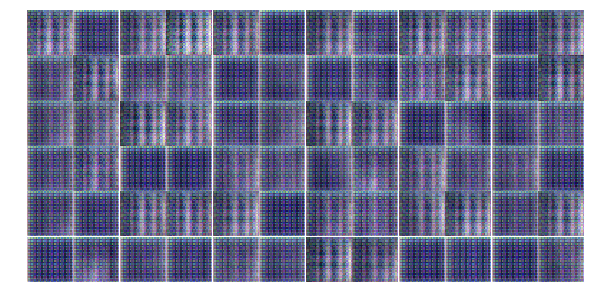

Epoch 1/25... Discriminator Loss: 1.2578... Generator Loss: 0.6365
Epoch 1/25... Discriminator Loss: 1.3139... Generator Loss: 0.5753
Epoch 1/25... Discriminator Loss: 1.1945... Generator Loss: 0.6911
Epoch 1/25... Discriminator Loss: 1.1473... Generator Loss: 0.7490
Epoch 1/25... Discriminator Loss: 1.4034... Generator Loss: 0.6563
Epoch 1/25... Discriminator Loss: 1.4711... Generator Loss: 0.7047
Epoch 1/25... Discriminator Loss: 1.3787... Generator Loss: 0.8524
Epoch 1/25... Discriminator Loss: 1.2949... Generator Loss: 0.8608
Epoch 1/25... Discriminator Loss: 1.3710... Generator Loss: 0.6536
Epoch 1/25... Discriminator Loss: 1.4469... Generator Loss: 0.7199


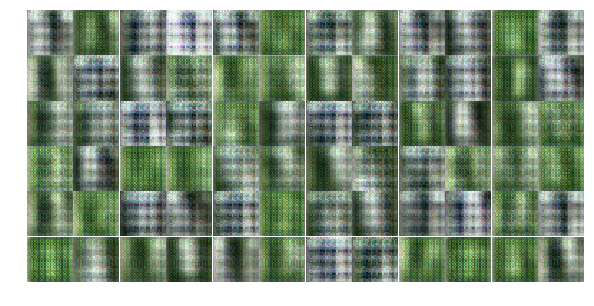

Epoch 1/25... Discriminator Loss: 1.0909... Generator Loss: 0.8392
Epoch 1/25... Discriminator Loss: 1.2164... Generator Loss: 0.7894
Epoch 1/25... Discriminator Loss: 1.2571... Generator Loss: 0.8080
Epoch 1/25... Discriminator Loss: 1.3575... Generator Loss: 0.7032
Epoch 1/25... Discriminator Loss: 1.4722... Generator Loss: 0.6557
Epoch 1/25... Discriminator Loss: 1.3977... Generator Loss: 0.7155
Epoch 1/25... Discriminator Loss: 1.3300... Generator Loss: 0.7973
Epoch 1/25... Discriminator Loss: 1.3402... Generator Loss: 0.7201
Epoch 2/25... Discriminator Loss: 1.2956... Generator Loss: 0.6873
Epoch 2/25... Discriminator Loss: 1.3304... Generator Loss: 0.7811


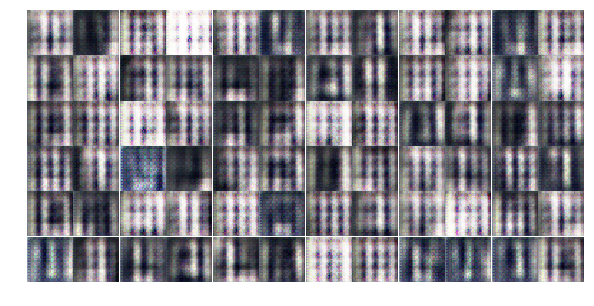

Epoch 2/25... Discriminator Loss: 1.2434... Generator Loss: 0.7946
Epoch 2/25... Discriminator Loss: 1.2992... Generator Loss: 0.7493
Epoch 2/25... Discriminator Loss: 1.4856... Generator Loss: 0.6754
Epoch 2/25... Discriminator Loss: 1.2452... Generator Loss: 0.8109
Epoch 2/25... Discriminator Loss: 1.3683... Generator Loss: 0.8085
Epoch 2/25... Discriminator Loss: 1.4934... Generator Loss: 0.6640
Epoch 2/25... Discriminator Loss: 1.2649... Generator Loss: 0.7371
Epoch 2/25... Discriminator Loss: 1.3496... Generator Loss: 0.6494
Epoch 2/25... Discriminator Loss: 1.4520... Generator Loss: 0.7021
Epoch 2/25... Discriminator Loss: 1.3825... Generator Loss: 0.7539


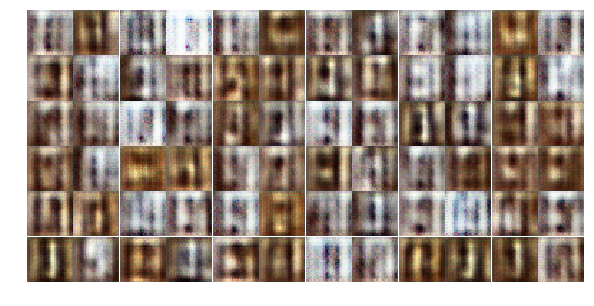

Epoch 2/25... Discriminator Loss: 1.3143... Generator Loss: 0.7569
Epoch 2/25... Discriminator Loss: 1.4287... Generator Loss: 0.6709
Epoch 2/25... Discriminator Loss: 1.2871... Generator Loss: 0.7002
Epoch 2/25... Discriminator Loss: 1.4815... Generator Loss: 0.6839
Epoch 2/25... Discriminator Loss: 1.3056... Generator Loss: 0.7568
Epoch 2/25... Discriminator Loss: 1.3604... Generator Loss: 0.7332
Epoch 2/25... Discriminator Loss: 1.3861... Generator Loss: 0.6387
Epoch 2/25... Discriminator Loss: 1.4028... Generator Loss: 0.7328
Epoch 2/25... Discriminator Loss: 1.3651... Generator Loss: 0.7265
Epoch 2/25... Discriminator Loss: 1.3331... Generator Loss: 0.7149


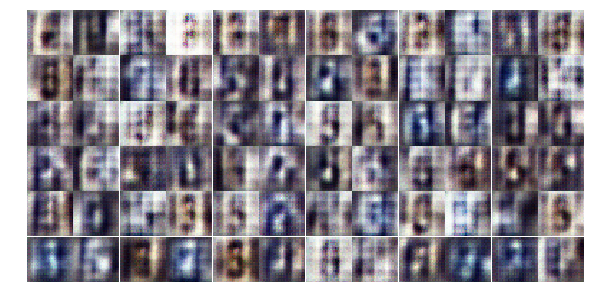

Epoch 2/25... Discriminator Loss: 1.3825... Generator Loss: 0.6630
Epoch 2/25... Discriminator Loss: 1.3496... Generator Loss: 0.7567
Epoch 2/25... Discriminator Loss: 1.3955... Generator Loss: 0.7322
Epoch 2/25... Discriminator Loss: 1.3332... Generator Loss: 0.7192
Epoch 2/25... Discriminator Loss: 1.4169... Generator Loss: 0.6708
Epoch 2/25... Discriminator Loss: 1.3343... Generator Loss: 0.7044
Epoch 2/25... Discriminator Loss: 1.3685... Generator Loss: 0.7712
Epoch 3/25... Discriminator Loss: 1.3238... Generator Loss: 0.6964
Epoch 3/25... Discriminator Loss: 1.3576... Generator Loss: 0.6867
Epoch 3/25... Discriminator Loss: 1.3613... Generator Loss: 0.7763


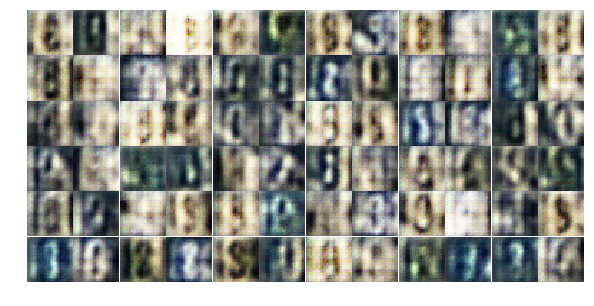

Epoch 3/25... Discriminator Loss: 1.3187... Generator Loss: 0.6885
Epoch 3/25... Discriminator Loss: 1.3473... Generator Loss: 0.7518
Epoch 3/25... Discriminator Loss: 1.4979... Generator Loss: 0.9674
Epoch 3/25... Discriminator Loss: 1.3231... Generator Loss: 0.6999
Epoch 3/25... Discriminator Loss: 1.4725... Generator Loss: 0.6433
Epoch 3/25... Discriminator Loss: 1.2771... Generator Loss: 0.6947
Epoch 3/25... Discriminator Loss: 1.4292... Generator Loss: 0.6998
Epoch 3/25... Discriminator Loss: 1.2644... Generator Loss: 0.6720
Epoch 3/25... Discriminator Loss: 1.4127... Generator Loss: 0.7400
Epoch 3/25... Discriminator Loss: 1.2704... Generator Loss: 0.6467


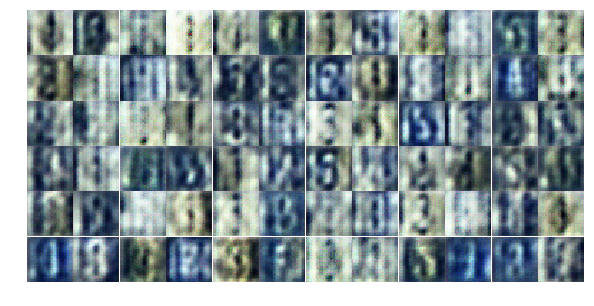

Epoch 3/25... Discriminator Loss: 1.3826... Generator Loss: 0.7335
Epoch 3/25... Discriminator Loss: 1.2901... Generator Loss: 0.6492
Epoch 3/25... Discriminator Loss: 1.3340... Generator Loss: 0.7328
Epoch 3/25... Discriminator Loss: 1.4424... Generator Loss: 0.7053
Epoch 3/25... Discriminator Loss: 1.3593... Generator Loss: 0.7678
Epoch 3/25... Discriminator Loss: 1.3594... Generator Loss: 0.6433
Epoch 3/25... Discriminator Loss: 1.3617... Generator Loss: 0.6556
Epoch 3/25... Discriminator Loss: 1.3103... Generator Loss: 0.6842
Epoch 3/25... Discriminator Loss: 1.2319... Generator Loss: 0.7760
Epoch 3/25... Discriminator Loss: 1.3323... Generator Loss: 0.6910


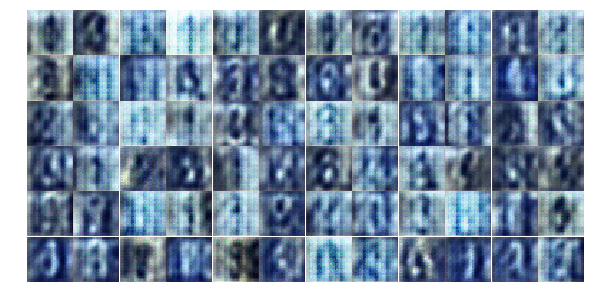

Epoch 3/25... Discriminator Loss: 1.3060... Generator Loss: 0.9413
Epoch 3/25... Discriminator Loss: 1.3743... Generator Loss: 0.8540
Epoch 3/25... Discriminator Loss: 1.2608... Generator Loss: 0.6651
Epoch 3/25... Discriminator Loss: 1.2768... Generator Loss: 0.7018
Epoch 3/25... Discriminator Loss: 1.4507... Generator Loss: 0.7699
Epoch 3/25... Discriminator Loss: 1.3379... Generator Loss: 0.7511
Epoch 4/25... Discriminator Loss: 1.6858... Generator Loss: 0.6060
Epoch 4/25... Discriminator Loss: 1.3178... Generator Loss: 0.9095
Epoch 4/25... Discriminator Loss: 1.3619... Generator Loss: 0.6999
Epoch 4/25... Discriminator Loss: 1.2037... Generator Loss: 0.7582


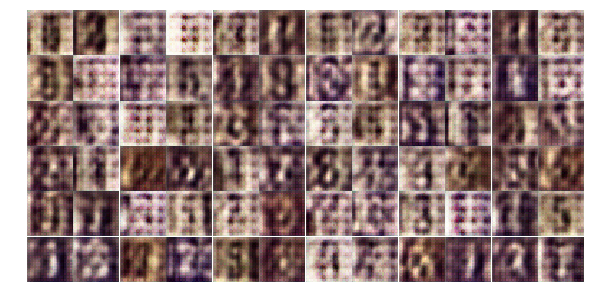

Epoch 4/25... Discriminator Loss: 1.3995... Generator Loss: 0.7871
Epoch 4/25... Discriminator Loss: 1.2257... Generator Loss: 0.7981
Epoch 4/25... Discriminator Loss: 1.2202... Generator Loss: 0.7487
Epoch 4/25... Discriminator Loss: 1.1827... Generator Loss: 1.2085
Epoch 4/25... Discriminator Loss: 1.2838... Generator Loss: 0.9976
Epoch 4/25... Discriminator Loss: 1.0848... Generator Loss: 0.8133
Epoch 4/25... Discriminator Loss: 0.8901... Generator Loss: 1.2011
Epoch 4/25... Discriminator Loss: 1.4668... Generator Loss: 0.5528
Epoch 4/25... Discriminator Loss: 1.0467... Generator Loss: 0.8305
Epoch 4/25... Discriminator Loss: 1.0020... Generator Loss: 0.7395


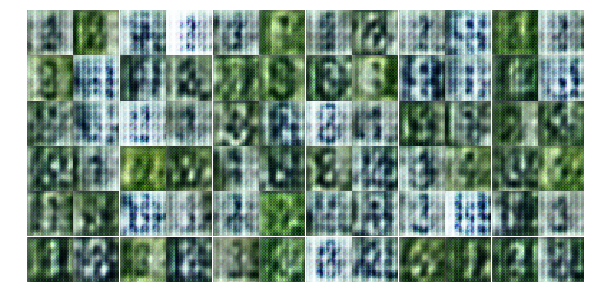

Epoch 4/25... Discriminator Loss: 1.0796... Generator Loss: 0.8009
Epoch 4/25... Discriminator Loss: 1.3322... Generator Loss: 1.1367
Epoch 4/25... Discriminator Loss: 1.3875... Generator Loss: 0.6553
Epoch 4/25... Discriminator Loss: 1.2764... Generator Loss: 0.7824
Epoch 4/25... Discriminator Loss: 1.2620... Generator Loss: 0.7323
Epoch 4/25... Discriminator Loss: 0.9213... Generator Loss: 1.0765
Epoch 4/25... Discriminator Loss: 0.8688... Generator Loss: 1.0709
Epoch 4/25... Discriminator Loss: 2.5612... Generator Loss: 2.1459
Epoch 4/25... Discriminator Loss: 1.2999... Generator Loss: 0.7850
Epoch 4/25... Discriminator Loss: 1.4031... Generator Loss: 0.7012


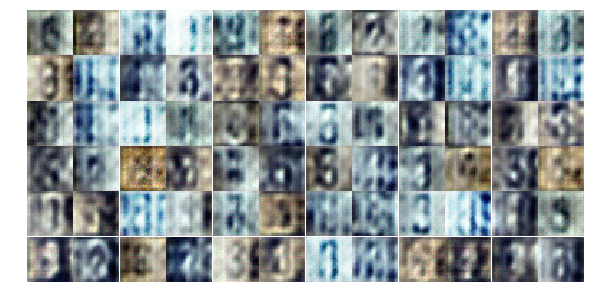

Epoch 4/25... Discriminator Loss: 1.3747... Generator Loss: 0.7279
Epoch 4/25... Discriminator Loss: 1.1620... Generator Loss: 0.7342
Epoch 4/25... Discriminator Loss: 1.2706... Generator Loss: 0.7701
Epoch 4/25... Discriminator Loss: 1.5410... Generator Loss: 0.7175
Epoch 5/25... Discriminator Loss: 1.3225... Generator Loss: 0.8530
Epoch 5/25... Discriminator Loss: 1.3737... Generator Loss: 0.8185
Epoch 5/25... Discriminator Loss: 1.2393... Generator Loss: 0.7762
Epoch 5/25... Discriminator Loss: 1.3458... Generator Loss: 0.7138
Epoch 5/25... Discriminator Loss: 1.0414... Generator Loss: 0.9451
Epoch 5/25... Discriminator Loss: 1.3327... Generator Loss: 0.8832


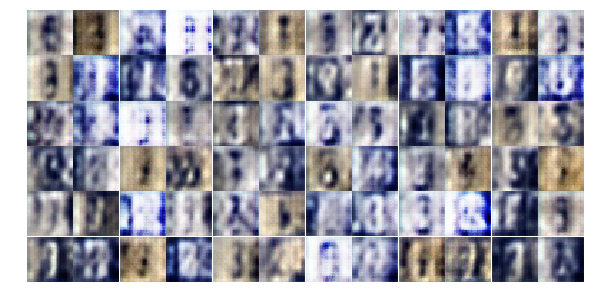

Epoch 5/25... Discriminator Loss: 1.1673... Generator Loss: 1.1272
Epoch 5/25... Discriminator Loss: 1.5884... Generator Loss: 1.2471
Epoch 5/25... Discriminator Loss: 1.2505... Generator Loss: 0.7647
Epoch 5/25... Discriminator Loss: 1.2820... Generator Loss: 0.9042
Epoch 5/25... Discriminator Loss: 1.3578... Generator Loss: 0.8803
Epoch 5/25... Discriminator Loss: 1.4237... Generator Loss: 0.8578
Epoch 5/25... Discriminator Loss: 1.3226... Generator Loss: 0.7106
Epoch 5/25... Discriminator Loss: 1.3169... Generator Loss: 0.8394
Epoch 5/25... Discriminator Loss: 1.2058... Generator Loss: 0.7675
Epoch 5/25... Discriminator Loss: 1.5223... Generator Loss: 0.8079


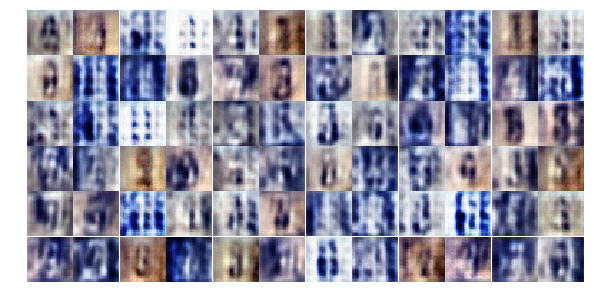

Epoch 5/25... Discriminator Loss: 1.1883... Generator Loss: 0.7387
Epoch 5/25... Discriminator Loss: 1.2564... Generator Loss: 0.8979
Epoch 5/25... Discriminator Loss: 1.3244... Generator Loss: 0.8442
Epoch 5/25... Discriminator Loss: 1.4389... Generator Loss: 0.8181
Epoch 5/25... Discriminator Loss: 1.3161... Generator Loss: 0.8014
Epoch 5/25... Discriminator Loss: 1.3277... Generator Loss: 0.8204
Epoch 5/25... Discriminator Loss: 1.2927... Generator Loss: 0.7587
Epoch 5/25... Discriminator Loss: 1.8542... Generator Loss: 0.4733
Epoch 5/25... Discriminator Loss: 1.3731... Generator Loss: 0.7361
Epoch 5/25... Discriminator Loss: 1.3369... Generator Loss: 0.7199


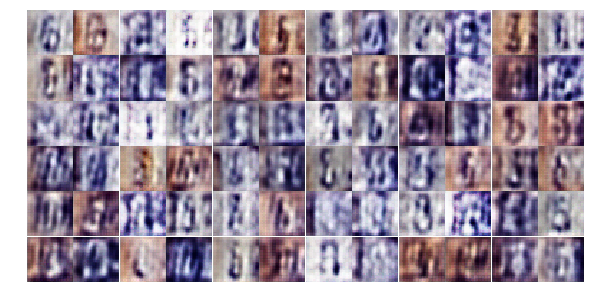

Epoch 5/25... Discriminator Loss: 1.3170... Generator Loss: 0.7331
Epoch 5/25... Discriminator Loss: 1.3327... Generator Loss: 0.7461
Epoch 5/25... Discriminator Loss: 1.2791... Generator Loss: 0.7649
Epoch 6/25... Discriminator Loss: 1.3085... Generator Loss: 0.8146
Epoch 6/25... Discriminator Loss: 1.2773... Generator Loss: 0.8107
Epoch 6/25... Discriminator Loss: 1.2767... Generator Loss: 0.7450
Epoch 6/25... Discriminator Loss: 1.3383... Generator Loss: 0.7034
Epoch 6/25... Discriminator Loss: 1.3416... Generator Loss: 0.6657
Epoch 6/25... Discriminator Loss: 1.3292... Generator Loss: 0.7524
Epoch 6/25... Discriminator Loss: 1.2378... Generator Loss: 0.7932


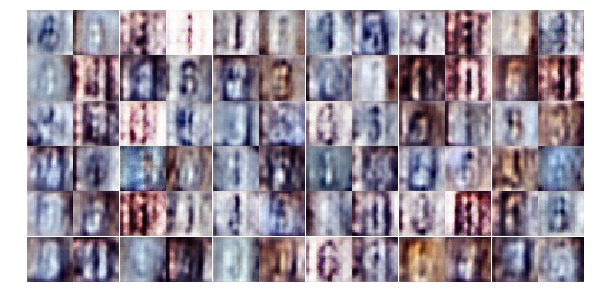

Epoch 6/25... Discriminator Loss: 1.3611... Generator Loss: 0.6817
Epoch 6/25... Discriminator Loss: 1.2979... Generator Loss: 0.7801
Epoch 6/25... Discriminator Loss: 1.3124... Generator Loss: 0.7624
Epoch 6/25... Discriminator Loss: 1.3934... Generator Loss: 0.8943
Epoch 6/25... Discriminator Loss: 1.4642... Generator Loss: 0.8030
Epoch 6/25... Discriminator Loss: 1.2752... Generator Loss: 0.8474
Epoch 6/25... Discriminator Loss: 1.3701... Generator Loss: 0.7399
Epoch 6/25... Discriminator Loss: 1.2454... Generator Loss: 0.8990
Epoch 6/25... Discriminator Loss: 1.1776... Generator Loss: 0.7283
Epoch 6/25... Discriminator Loss: 1.3413... Generator Loss: 0.7185


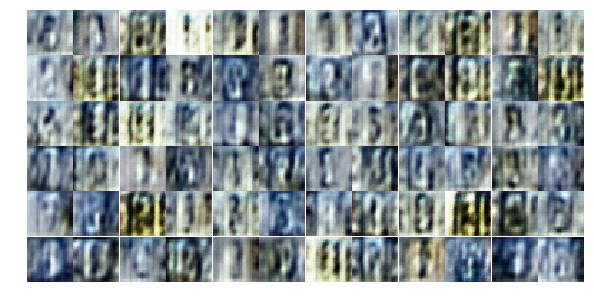

Epoch 6/25... Discriminator Loss: 1.3876... Generator Loss: 0.7517
Epoch 6/25... Discriminator Loss: 1.3742... Generator Loss: 0.7009
Epoch 6/25... Discriminator Loss: 1.4136... Generator Loss: 0.6943
Epoch 6/25... Discriminator Loss: 1.3499... Generator Loss: 0.7796
Epoch 6/25... Discriminator Loss: 1.3159... Generator Loss: 0.7273
Epoch 6/25... Discriminator Loss: 1.3818... Generator Loss: 0.7188
Epoch 6/25... Discriminator Loss: 1.3656... Generator Loss: 0.7131
Epoch 6/25... Discriminator Loss: 1.2943... Generator Loss: 0.7921
Epoch 6/25... Discriminator Loss: 1.4073... Generator Loss: 0.5703
Epoch 6/25... Discriminator Loss: 1.3584... Generator Loss: 0.7224


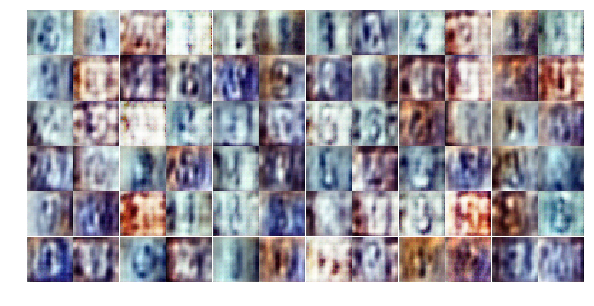

Epoch 6/25... Discriminator Loss: 1.2777... Generator Loss: 0.7116
Epoch 6/25... Discriminator Loss: 1.4246... Generator Loss: 0.7213
Epoch 7/25... Discriminator Loss: 1.3674... Generator Loss: 0.7444
Epoch 7/25... Discriminator Loss: 1.3833... Generator Loss: 0.7501
Epoch 7/25... Discriminator Loss: 1.3045... Generator Loss: 0.7291
Epoch 7/25... Discriminator Loss: 1.2847... Generator Loss: 0.7649
Epoch 7/25... Discriminator Loss: 1.4280... Generator Loss: 0.7343
Epoch 7/25... Discriminator Loss: 1.2854... Generator Loss: 0.8608
Epoch 7/25... Discriminator Loss: 1.3958... Generator Loss: 0.7650
Epoch 7/25... Discriminator Loss: 1.2657... Generator Loss: 0.7091


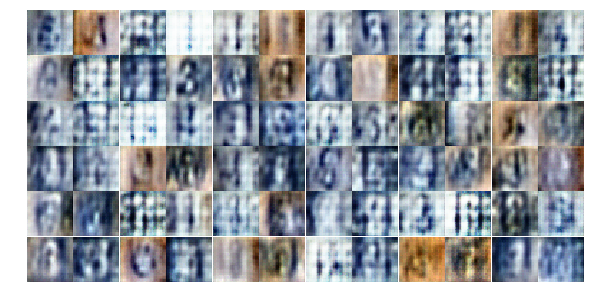

Epoch 7/25... Discriminator Loss: 1.3381... Generator Loss: 0.8412
Epoch 7/25... Discriminator Loss: 1.3606... Generator Loss: 0.6574
Epoch 7/25... Discriminator Loss: 1.5314... Generator Loss: 0.3917
Epoch 7/25... Discriminator Loss: 1.3551... Generator Loss: 0.8576
Epoch 7/25... Discriminator Loss: 1.3268... Generator Loss: 0.7490
Epoch 7/25... Discriminator Loss: 1.1345... Generator Loss: 0.8668
Epoch 7/25... Discriminator Loss: 1.3308... Generator Loss: 0.8560
Epoch 7/25... Discriminator Loss: 1.2249... Generator Loss: 0.8291
Epoch 7/25... Discriminator Loss: 1.2496... Generator Loss: 0.7865
Epoch 7/25... Discriminator Loss: 1.0616... Generator Loss: 0.8554


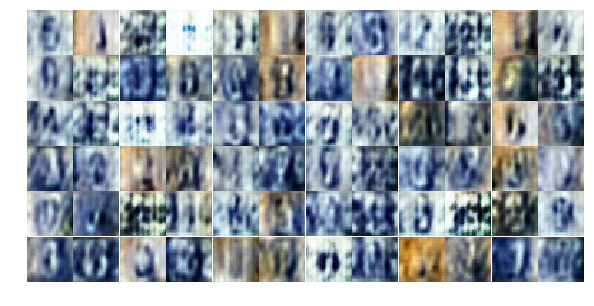

Epoch 7/25... Discriminator Loss: 1.4194... Generator Loss: 0.8666
Epoch 7/25... Discriminator Loss: 1.2563... Generator Loss: 0.8128
Epoch 7/25... Discriminator Loss: 1.3481... Generator Loss: 0.6189
Epoch 7/25... Discriminator Loss: 1.2328... Generator Loss: 0.7528
Epoch 7/25... Discriminator Loss: 1.4686... Generator Loss: 0.7020
Epoch 7/25... Discriminator Loss: 1.1896... Generator Loss: 1.0894
Epoch 7/25... Discriminator Loss: 1.3187... Generator Loss: 0.8245
Epoch 7/25... Discriminator Loss: 1.0378... Generator Loss: 0.8361
Epoch 7/25... Discriminator Loss: 1.3934... Generator Loss: 0.8038
Epoch 7/25... Discriminator Loss: 1.4016... Generator Loss: 0.6902


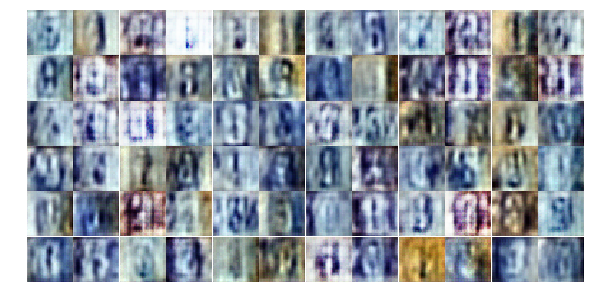

Epoch 8/25... Discriminator Loss: 1.3399... Generator Loss: 0.7821
Epoch 8/25... Discriminator Loss: 1.1930... Generator Loss: 0.8189
Epoch 8/25... Discriminator Loss: 1.3682... Generator Loss: 0.7843
Epoch 8/25... Discriminator Loss: 1.2075... Generator Loss: 0.7706
Epoch 8/25... Discriminator Loss: 1.5338... Generator Loss: 1.1729
Epoch 8/25... Discriminator Loss: 1.1632... Generator Loss: 0.7659
Epoch 8/25... Discriminator Loss: 1.2542... Generator Loss: 0.7481
Epoch 8/25... Discriminator Loss: 1.2199... Generator Loss: 0.7920
Epoch 8/25... Discriminator Loss: 1.3463... Generator Loss: 0.8498
Epoch 8/25... Discriminator Loss: 1.2724... Generator Loss: 0.7419


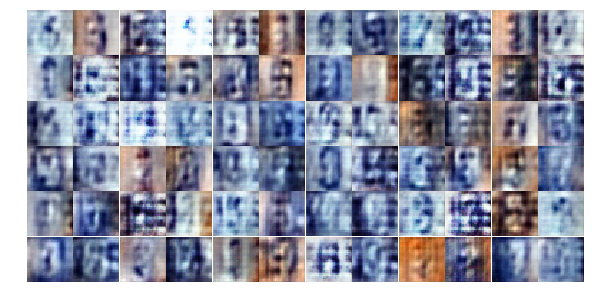

Epoch 8/25... Discriminator Loss: 1.6656... Generator Loss: 0.9997
Epoch 8/25... Discriminator Loss: 1.3103... Generator Loss: 0.6469
Epoch 8/25... Discriminator Loss: 1.3281... Generator Loss: 0.8646
Epoch 8/25... Discriminator Loss: 1.2356... Generator Loss: 0.6103
Epoch 8/25... Discriminator Loss: 1.2088... Generator Loss: 0.7694
Epoch 8/25... Discriminator Loss: 1.2179... Generator Loss: 0.7748
Epoch 8/25... Discriminator Loss: 1.2562... Generator Loss: 0.8534
Epoch 8/25... Discriminator Loss: 1.3548... Generator Loss: 0.7537
Epoch 8/25... Discriminator Loss: 1.1118... Generator Loss: 0.8702
Epoch 8/25... Discriminator Loss: 1.3061... Generator Loss: 0.6826


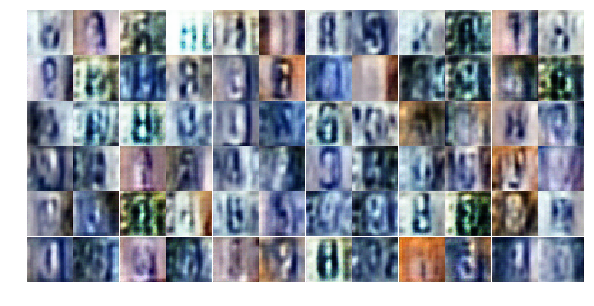

Epoch 8/25... Discriminator Loss: 1.3622... Generator Loss: 0.9226
Epoch 8/25... Discriminator Loss: 1.4008... Generator Loss: 0.9337
Epoch 8/25... Discriminator Loss: 1.1081... Generator Loss: 0.8373
Epoch 8/25... Discriminator Loss: 1.7889... Generator Loss: 0.6315
Epoch 8/25... Discriminator Loss: 1.3371... Generator Loss: 0.8464
Epoch 8/25... Discriminator Loss: 1.1953... Generator Loss: 0.7647
Epoch 8/25... Discriminator Loss: 1.2901... Generator Loss: 0.7694
Epoch 8/25... Discriminator Loss: 1.3732... Generator Loss: 0.7368
Epoch 8/25... Discriminator Loss: 1.3563... Generator Loss: 0.7583
Epoch 9/25... Discriminator Loss: 1.0511... Generator Loss: 0.9909


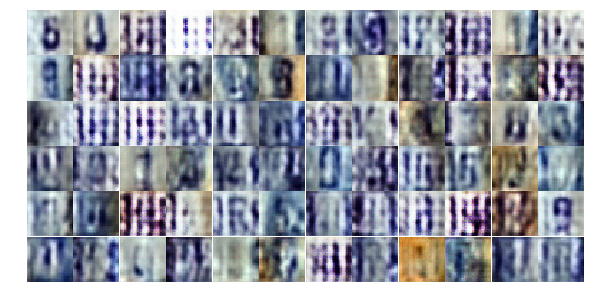

Epoch 9/25... Discriminator Loss: 1.0863... Generator Loss: 1.1054
Epoch 9/25... Discriminator Loss: 1.1567... Generator Loss: 0.8218
Epoch 9/25... Discriminator Loss: 1.1276... Generator Loss: 0.9938
Epoch 9/25... Discriminator Loss: 1.1922... Generator Loss: 0.7883
Epoch 9/25... Discriminator Loss: 0.8423... Generator Loss: 1.1245
Epoch 9/25... Discriminator Loss: 1.2585... Generator Loss: 0.8060
Epoch 9/25... Discriminator Loss: 1.4583... Generator Loss: 0.6594
Epoch 9/25... Discriminator Loss: 1.2631... Generator Loss: 0.8330
Epoch 9/25... Discriminator Loss: 1.1317... Generator Loss: 0.9361
Epoch 9/25... Discriminator Loss: 1.1717... Generator Loss: 0.7888


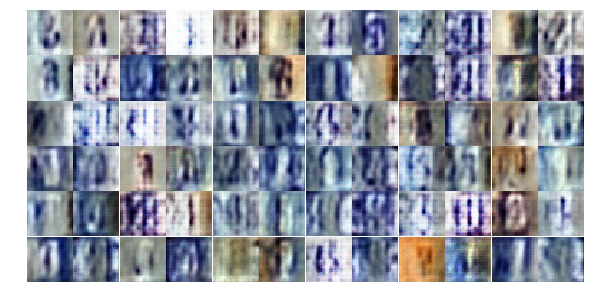

Epoch 9/25... Discriminator Loss: 1.1177... Generator Loss: 0.8707
Epoch 9/25... Discriminator Loss: 1.1501... Generator Loss: 0.9768
Epoch 9/25... Discriminator Loss: 1.2157... Generator Loss: 0.7262
Epoch 9/25... Discriminator Loss: 1.3454... Generator Loss: 0.8182
Epoch 9/25... Discriminator Loss: 1.2054... Generator Loss: 0.8225
Epoch 9/25... Discriminator Loss: 1.4483... Generator Loss: 0.8307
Epoch 9/25... Discriminator Loss: 1.0586... Generator Loss: 0.8953
Epoch 9/25... Discriminator Loss: 1.3285... Generator Loss: 0.7443
Epoch 9/25... Discriminator Loss: 1.6190... Generator Loss: 0.5342
Epoch 9/25... Discriminator Loss: 1.6571... Generator Loss: 0.9826


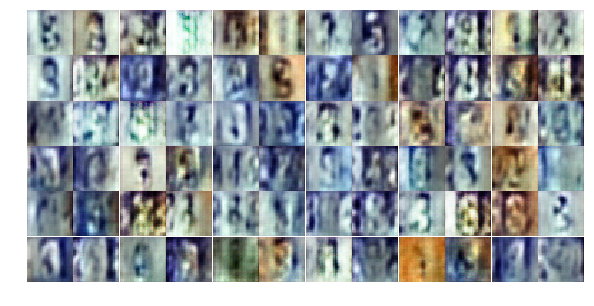

Epoch 9/25... Discriminator Loss: 1.2887... Generator Loss: 0.8561
Epoch 9/25... Discriminator Loss: 1.2082... Generator Loss: 0.7620
Epoch 9/25... Discriminator Loss: 1.2944... Generator Loss: 0.6376
Epoch 9/25... Discriminator Loss: 1.1236... Generator Loss: 1.2879
Epoch 9/25... Discriminator Loss: 1.2920... Generator Loss: 0.7011
Epoch 9/25... Discriminator Loss: 1.2008... Generator Loss: 0.7346
Epoch 9/25... Discriminator Loss: 1.2848... Generator Loss: 0.9017
Epoch 9/25... Discriminator Loss: 1.2140... Generator Loss: 0.9237
Epoch 10/25... Discriminator Loss: 1.2161... Generator Loss: 0.8853
Epoch 10/25... Discriminator Loss: 1.0713... Generator Loss: 0.8988


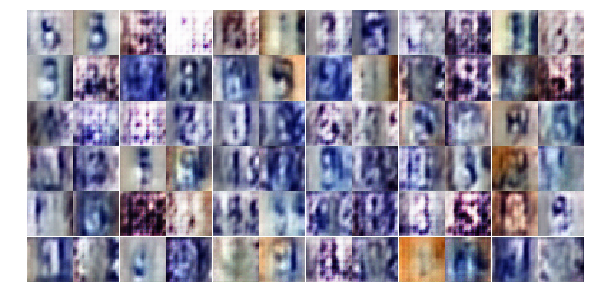

Epoch 10/25... Discriminator Loss: 1.2450... Generator Loss: 0.8461
Epoch 10/25... Discriminator Loss: 1.0855... Generator Loss: 1.0052
Epoch 10/25... Discriminator Loss: 1.2496... Generator Loss: 0.9948
Epoch 10/25... Discriminator Loss: 1.4162... Generator Loss: 1.4337
Epoch 10/25... Discriminator Loss: 1.1879... Generator Loss: 0.8425
Epoch 10/25... Discriminator Loss: 1.0940... Generator Loss: 0.9930
Epoch 10/25... Discriminator Loss: 1.1263... Generator Loss: 0.9384
Epoch 10/25... Discriminator Loss: 1.2395... Generator Loss: 1.0749
Epoch 10/25... Discriminator Loss: 1.3531... Generator Loss: 0.9263
Epoch 10/25... Discriminator Loss: 1.1352... Generator Loss: 0.7027


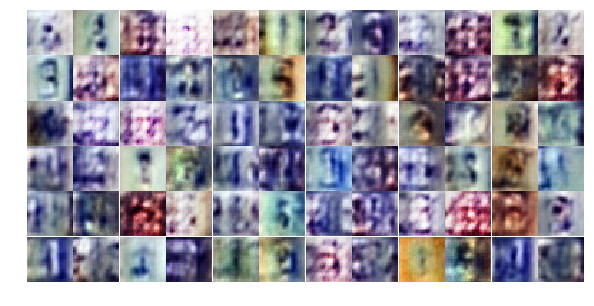

Epoch 10/25... Discriminator Loss: 0.9710... Generator Loss: 0.9682
Epoch 10/25... Discriminator Loss: 1.1275... Generator Loss: 0.9573
Epoch 10/25... Discriminator Loss: 1.2201... Generator Loss: 0.8559
Epoch 10/25... Discriminator Loss: 1.0535... Generator Loss: 0.8497
Epoch 10/25... Discriminator Loss: 1.1169... Generator Loss: 0.9815
Epoch 10/25... Discriminator Loss: 1.1005... Generator Loss: 0.8972
Epoch 10/25... Discriminator Loss: 1.1624... Generator Loss: 0.8124
Epoch 10/25... Discriminator Loss: 1.2160... Generator Loss: 0.6647
Epoch 10/25... Discriminator Loss: 0.8949... Generator Loss: 1.0110
Epoch 10/25... Discriminator Loss: 1.2209... Generator Loss: 0.9719


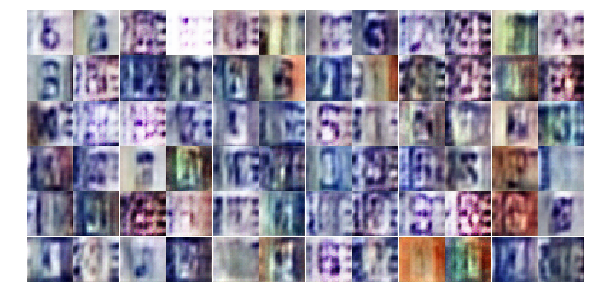

Epoch 10/25... Discriminator Loss: 1.0095... Generator Loss: 0.9299
Epoch 10/25... Discriminator Loss: 1.1094... Generator Loss: 1.0075
Epoch 10/25... Discriminator Loss: 1.4625... Generator Loss: 0.8353
Epoch 10/25... Discriminator Loss: 1.2126... Generator Loss: 0.8550
Epoch 10/25... Discriminator Loss: 1.1510... Generator Loss: 0.8540
Epoch 10/25... Discriminator Loss: 1.2382... Generator Loss: 0.8242
Epoch 10/25... Discriminator Loss: 1.0144... Generator Loss: 0.9421
Epoch 11/25... Discriminator Loss: 1.0831... Generator Loss: 0.8857
Epoch 11/25... Discriminator Loss: 1.1157... Generator Loss: 1.0841
Epoch 11/25... Discriminator Loss: 1.0451... Generator Loss: 1.1437


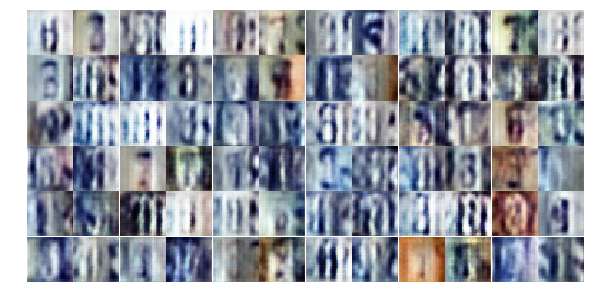

Epoch 11/25... Discriminator Loss: 1.0804... Generator Loss: 0.8896
Epoch 11/25... Discriminator Loss: 1.0604... Generator Loss: 1.0930
Epoch 11/25... Discriminator Loss: 0.8884... Generator Loss: 1.1421
Epoch 11/25... Discriminator Loss: 1.0844... Generator Loss: 0.8358
Epoch 11/25... Discriminator Loss: 1.1160... Generator Loss: 0.9171
Epoch 11/25... Discriminator Loss: 1.0794... Generator Loss: 0.9735
Epoch 11/25... Discriminator Loss: 1.1445... Generator Loss: 0.8748
Epoch 11/25... Discriminator Loss: 1.0611... Generator Loss: 1.0744
Epoch 11/25... Discriminator Loss: 1.0901... Generator Loss: 0.9853
Epoch 11/25... Discriminator Loss: 1.2055... Generator Loss: 0.6659


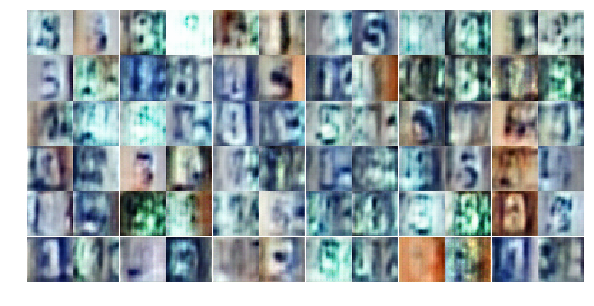

Epoch 11/25... Discriminator Loss: 1.1096... Generator Loss: 0.9496
Epoch 11/25... Discriminator Loss: 1.1964... Generator Loss: 0.8750
Epoch 11/25... Discriminator Loss: 1.1538... Generator Loss: 0.9400
Epoch 11/25... Discriminator Loss: 1.1460... Generator Loss: 1.1534
Epoch 11/25... Discriminator Loss: 1.1257... Generator Loss: 1.2410
Epoch 11/25... Discriminator Loss: 1.4679... Generator Loss: 0.8563
Epoch 11/25... Discriminator Loss: 1.1278... Generator Loss: 0.8836
Epoch 11/25... Discriminator Loss: 1.1142... Generator Loss: 0.8542
Epoch 11/25... Discriminator Loss: 1.1803... Generator Loss: 1.0248
Epoch 11/25... Discriminator Loss: 1.1033... Generator Loss: 0.9400


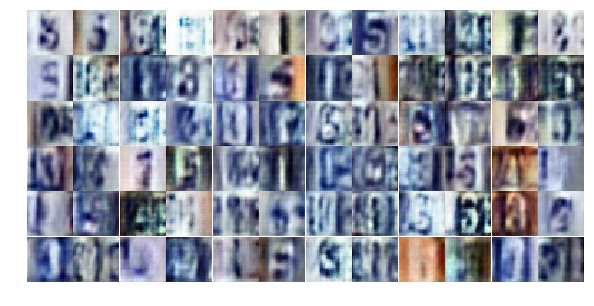

Epoch 11/25... Discriminator Loss: 1.2258... Generator Loss: 0.8074
Epoch 11/25... Discriminator Loss: 1.0835... Generator Loss: 1.1295
Epoch 11/25... Discriminator Loss: 1.1190... Generator Loss: 0.9798
Epoch 11/25... Discriminator Loss: 1.0832... Generator Loss: 0.9406
Epoch 11/25... Discriminator Loss: 1.3060... Generator Loss: 0.7255
Epoch 12/25... Discriminator Loss: 1.1299... Generator Loss: 0.8441
Epoch 12/25... Discriminator Loss: 1.0954... Generator Loss: 1.1200
Epoch 12/25... Discriminator Loss: 1.0578... Generator Loss: 0.9602
Epoch 12/25... Discriminator Loss: 1.1191... Generator Loss: 0.9332
Epoch 12/25... Discriminator Loss: 0.9871... Generator Loss: 1.0510


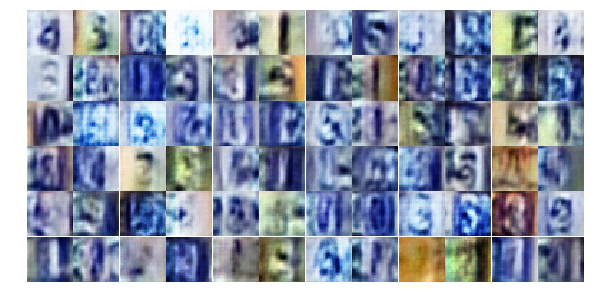

Epoch 12/25... Discriminator Loss: 1.2659... Generator Loss: 0.9071
Epoch 12/25... Discriminator Loss: 1.1594... Generator Loss: 0.8820
Epoch 12/25... Discriminator Loss: 1.1074... Generator Loss: 0.9001
Epoch 12/25... Discriminator Loss: 1.0861... Generator Loss: 1.0958
Epoch 12/25... Discriminator Loss: 1.2808... Generator Loss: 0.8164
Epoch 12/25... Discriminator Loss: 1.1292... Generator Loss: 0.9718
Epoch 12/25... Discriminator Loss: 1.0869... Generator Loss: 0.8620
Epoch 12/25... Discriminator Loss: 1.1247... Generator Loss: 0.9305
Epoch 12/25... Discriminator Loss: 1.1528... Generator Loss: 0.8231
Epoch 12/25... Discriminator Loss: 1.1631... Generator Loss: 0.9311


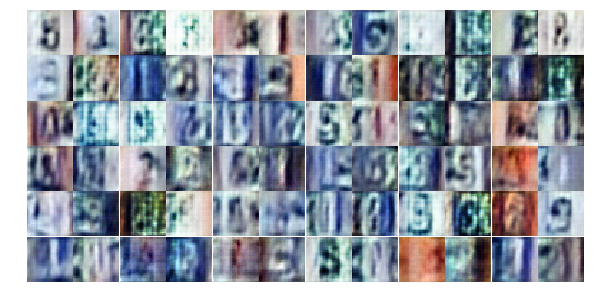

Epoch 12/25... Discriminator Loss: 1.0971... Generator Loss: 0.9499
Epoch 12/25... Discriminator Loss: 1.1493... Generator Loss: 0.8715
Epoch 12/25... Discriminator Loss: 1.0920... Generator Loss: 0.9598
Epoch 12/25... Discriminator Loss: 1.1608... Generator Loss: 0.9059
Epoch 12/25... Discriminator Loss: 1.1454... Generator Loss: 0.9704
Epoch 12/25... Discriminator Loss: 1.1483... Generator Loss: 0.9520
Epoch 12/25... Discriminator Loss: 1.1374... Generator Loss: 0.9434
Epoch 12/25... Discriminator Loss: 1.0694... Generator Loss: 0.8928
Epoch 12/25... Discriminator Loss: 1.2327... Generator Loss: 1.0693
Epoch 12/25... Discriminator Loss: 1.1428... Generator Loss: 0.9113


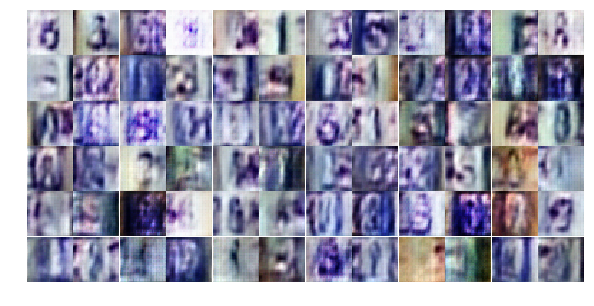

Epoch 12/25... Discriminator Loss: 1.1114... Generator Loss: 0.9489
Epoch 12/25... Discriminator Loss: 1.1221... Generator Loss: 0.9967
Epoch 12/25... Discriminator Loss: 1.0316... Generator Loss: 0.8523
Epoch 12/25... Discriminator Loss: 1.1182... Generator Loss: 0.9724
Epoch 13/25... Discriminator Loss: 1.0899... Generator Loss: 1.0187
Epoch 13/25... Discriminator Loss: 1.1674... Generator Loss: 1.1191
Epoch 13/25... Discriminator Loss: 1.1850... Generator Loss: 1.0730
Epoch 13/25... Discriminator Loss: 1.1744... Generator Loss: 0.8581
Epoch 13/25... Discriminator Loss: 1.1546... Generator Loss: 1.0331
Epoch 13/25... Discriminator Loss: 1.1528... Generator Loss: 0.8857


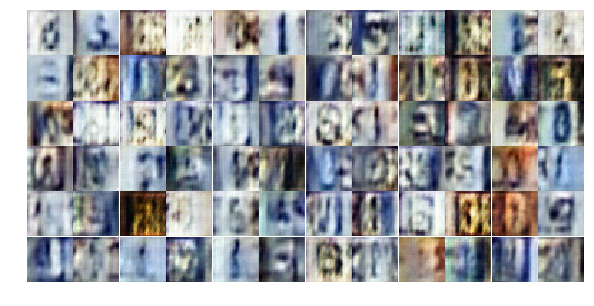

Epoch 13/25... Discriminator Loss: 1.1538... Generator Loss: 0.9124
Epoch 13/25... Discriminator Loss: 1.0993... Generator Loss: 0.9371
Epoch 13/25... Discriminator Loss: 1.0152... Generator Loss: 0.9483
Epoch 13/25... Discriminator Loss: 1.1490... Generator Loss: 0.9066
Epoch 13/25... Discriminator Loss: 1.0685... Generator Loss: 0.8987
Epoch 13/25... Discriminator Loss: 1.2880... Generator Loss: 1.4204
Epoch 13/25... Discriminator Loss: 1.0196... Generator Loss: 1.2095
Epoch 13/25... Discriminator Loss: 1.0956... Generator Loss: 0.9400
Epoch 13/25... Discriminator Loss: 1.1591... Generator Loss: 0.9759
Epoch 13/25... Discriminator Loss: 1.0346... Generator Loss: 0.9629


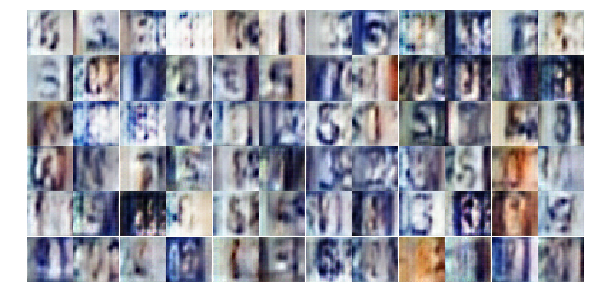

Epoch 13/25... Discriminator Loss: 1.1163... Generator Loss: 1.0819
Epoch 13/25... Discriminator Loss: 1.2584... Generator Loss: 0.8628
Epoch 13/25... Discriminator Loss: 1.0595... Generator Loss: 1.0650
Epoch 13/25... Discriminator Loss: 1.0990... Generator Loss: 0.9840
Epoch 13/25... Discriminator Loss: 1.1268... Generator Loss: 1.0720
Epoch 13/25... Discriminator Loss: 1.1334... Generator Loss: 0.8751
Epoch 13/25... Discriminator Loss: 1.0328... Generator Loss: 0.8919
Epoch 13/25... Discriminator Loss: 1.1008... Generator Loss: 0.8365
Epoch 13/25... Discriminator Loss: 1.0535... Generator Loss: 0.9656
Epoch 13/25... Discriminator Loss: 1.0833... Generator Loss: 0.9873


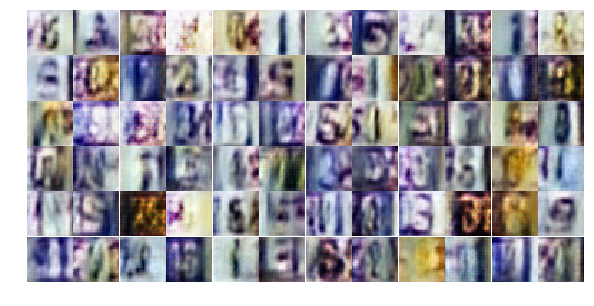

Epoch 13/25... Discriminator Loss: 1.0697... Generator Loss: 1.0439
Epoch 13/25... Discriminator Loss: 1.2440... Generator Loss: 1.3066
Epoch 13/25... Discriminator Loss: 1.1484... Generator Loss: 0.9477
Epoch 14/25... Discriminator Loss: 1.1507... Generator Loss: 0.8848
Epoch 14/25... Discriminator Loss: 1.1067... Generator Loss: 1.1295
Epoch 14/25... Discriminator Loss: 1.0745... Generator Loss: 0.9066
Epoch 14/25... Discriminator Loss: 1.1690... Generator Loss: 0.9385
Epoch 14/25... Discriminator Loss: 1.0989... Generator Loss: 0.8787
Epoch 14/25... Discriminator Loss: 1.7652... Generator Loss: 1.6039
Epoch 14/25... Discriminator Loss: 1.1379... Generator Loss: 0.9416


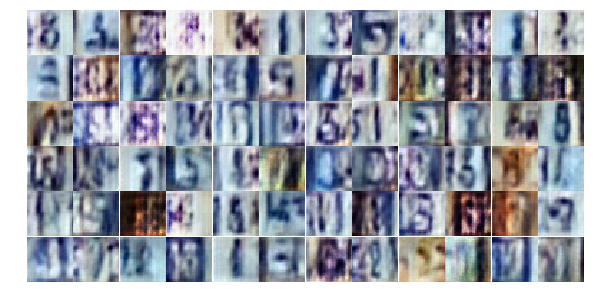

Epoch 14/25... Discriminator Loss: 1.1505... Generator Loss: 0.9448
Epoch 14/25... Discriminator Loss: 1.0451... Generator Loss: 0.9413
Epoch 14/25... Discriminator Loss: 1.2193... Generator Loss: 0.8557
Epoch 14/25... Discriminator Loss: 1.0324... Generator Loss: 0.9650
Epoch 14/25... Discriminator Loss: 0.9778... Generator Loss: 0.9965
Epoch 14/25... Discriminator Loss: 1.1920... Generator Loss: 1.1381
Epoch 14/25... Discriminator Loss: 1.0646... Generator Loss: 0.9683
Epoch 14/25... Discriminator Loss: 1.0545... Generator Loss: 1.0811
Epoch 14/25... Discriminator Loss: 1.2848... Generator Loss: 0.7011
Epoch 14/25... Discriminator Loss: 1.0520... Generator Loss: 0.9245


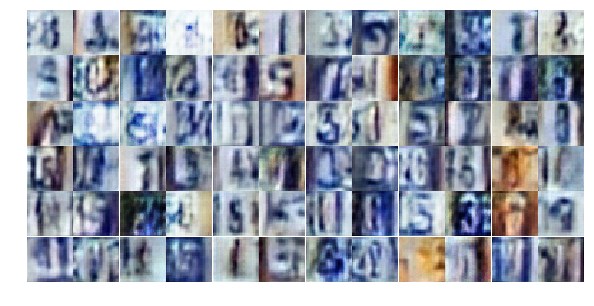

Epoch 14/25... Discriminator Loss: 1.0713... Generator Loss: 0.9640
Epoch 14/25... Discriminator Loss: 1.3120... Generator Loss: 1.1377
Epoch 14/25... Discriminator Loss: 1.1279... Generator Loss: 0.9609
Epoch 14/25... Discriminator Loss: 1.1132... Generator Loss: 0.8968
Epoch 14/25... Discriminator Loss: 1.1808... Generator Loss: 0.9203
Epoch 14/25... Discriminator Loss: 1.1694... Generator Loss: 0.9449
Epoch 14/25... Discriminator Loss: 1.1465... Generator Loss: 0.8468
Epoch 14/25... Discriminator Loss: 1.1344... Generator Loss: 0.9757
Epoch 14/25... Discriminator Loss: 1.1089... Generator Loss: 1.0911
Epoch 14/25... Discriminator Loss: 1.2199... Generator Loss: 0.8698


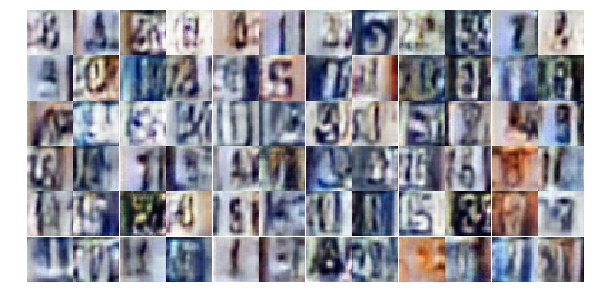

Epoch 14/25... Discriminator Loss: 1.2547... Generator Loss: 1.1785
Epoch 15/25... Discriminator Loss: 1.0833... Generator Loss: 0.9454
Epoch 15/25... Discriminator Loss: 1.1593... Generator Loss: 0.9027
Epoch 15/25... Discriminator Loss: 1.2000... Generator Loss: 1.0064
Epoch 15/25... Discriminator Loss: 1.1805... Generator Loss: 0.9428
Epoch 15/25... Discriminator Loss: 1.0554... Generator Loss: 0.9086
Epoch 15/25... Discriminator Loss: 1.1375... Generator Loss: 0.9347
Epoch 15/25... Discriminator Loss: 1.1005... Generator Loss: 1.0098
Epoch 15/25... Discriminator Loss: 1.0599... Generator Loss: 1.0964
Epoch 15/25... Discriminator Loss: 1.0516... Generator Loss: 0.9501


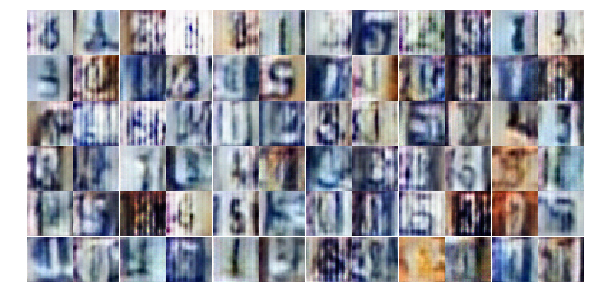

Epoch 15/25... Discriminator Loss: 1.2430... Generator Loss: 0.8818
Epoch 15/25... Discriminator Loss: 1.1185... Generator Loss: 0.9919
Epoch 15/25... Discriminator Loss: 1.1067... Generator Loss: 0.9920
Epoch 15/25... Discriminator Loss: 1.0355... Generator Loss: 1.0931
Epoch 15/25... Discriminator Loss: 1.0481... Generator Loss: 1.0524
Epoch 15/25... Discriminator Loss: 1.1965... Generator Loss: 1.0544
Epoch 15/25... Discriminator Loss: 1.1926... Generator Loss: 0.9121
Epoch 15/25... Discriminator Loss: 1.1522... Generator Loss: 1.0672
Epoch 15/25... Discriminator Loss: 1.2787... Generator Loss: 1.0808
Epoch 15/25... Discriminator Loss: 1.1395... Generator Loss: 0.9236


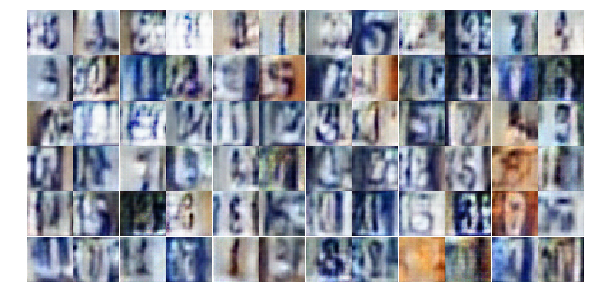

Epoch 15/25... Discriminator Loss: 1.1218... Generator Loss: 0.8158
Epoch 15/25... Discriminator Loss: 1.1115... Generator Loss: 0.9133
Epoch 15/25... Discriminator Loss: 1.1820... Generator Loss: 0.8452
Epoch 15/25... Discriminator Loss: 1.1010... Generator Loss: 0.9089
Epoch 15/25... Discriminator Loss: 1.1546... Generator Loss: 1.0065
Epoch 15/25... Discriminator Loss: 1.1305... Generator Loss: 0.8813
Epoch 15/25... Discriminator Loss: 1.1169... Generator Loss: 0.7303
Epoch 15/25... Discriminator Loss: 1.0881... Generator Loss: 0.9607
Epoch 15/25... Discriminator Loss: 1.0581... Generator Loss: 1.0649
Epoch 15/25... Discriminator Loss: 1.1513... Generator Loss: 1.0599


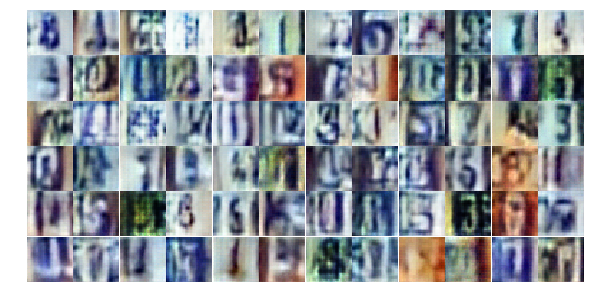

Epoch 16/25... Discriminator Loss: 1.0961... Generator Loss: 0.9140
Epoch 16/25... Discriminator Loss: 1.1784... Generator Loss: 0.9605
Epoch 16/25... Discriminator Loss: 1.0864... Generator Loss: 1.1274
Epoch 16/25... Discriminator Loss: 1.0869... Generator Loss: 0.8174
Epoch 16/25... Discriminator Loss: 1.1626... Generator Loss: 0.7822
Epoch 16/25... Discriminator Loss: 1.2597... Generator Loss: 1.1439
Epoch 16/25... Discriminator Loss: 1.1977... Generator Loss: 0.8582
Epoch 16/25... Discriminator Loss: 1.0995... Generator Loss: 0.9727
Epoch 16/25... Discriminator Loss: 1.2134... Generator Loss: 1.0373
Epoch 16/25... Discriminator Loss: 1.1469... Generator Loss: 0.8139


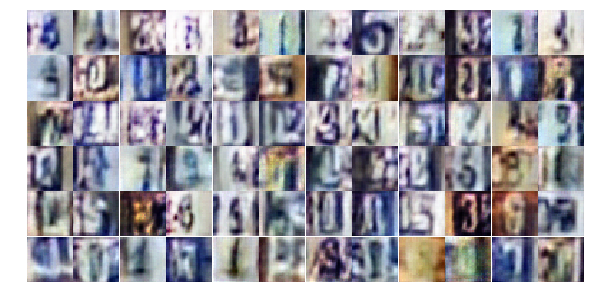

Epoch 16/25... Discriminator Loss: 1.1237... Generator Loss: 1.0174
Epoch 16/25... Discriminator Loss: 1.0156... Generator Loss: 0.9840
Epoch 16/25... Discriminator Loss: 1.1250... Generator Loss: 0.9479
Epoch 16/25... Discriminator Loss: 1.1982... Generator Loss: 0.9638
Epoch 16/25... Discriminator Loss: 1.0595... Generator Loss: 0.9856
Epoch 16/25... Discriminator Loss: 1.1842... Generator Loss: 0.8799
Epoch 16/25... Discriminator Loss: 1.0561... Generator Loss: 0.9990
Epoch 16/25... Discriminator Loss: 1.1692... Generator Loss: 0.9389
Epoch 16/25... Discriminator Loss: 1.0099... Generator Loss: 1.0004
Epoch 16/25... Discriminator Loss: 1.0812... Generator Loss: 0.9875


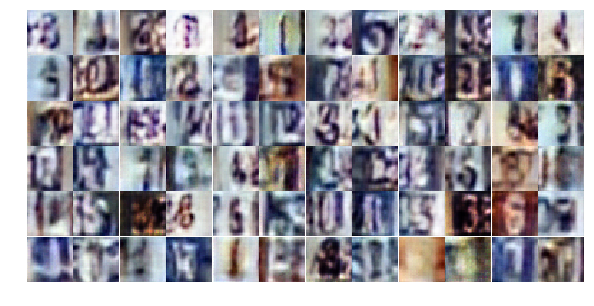

Epoch 16/25... Discriminator Loss: 1.1396... Generator Loss: 0.8132
Epoch 16/25... Discriminator Loss: 1.1772... Generator Loss: 1.0338
Epoch 16/25... Discriminator Loss: 1.0524... Generator Loss: 0.9067
Epoch 16/25... Discriminator Loss: 1.1823... Generator Loss: 1.0712
Epoch 16/25... Discriminator Loss: 1.1756... Generator Loss: 0.8642
Epoch 16/25... Discriminator Loss: 1.0736... Generator Loss: 0.8820
Epoch 16/25... Discriminator Loss: 1.0856... Generator Loss: 0.9014
Epoch 16/25... Discriminator Loss: 1.2095... Generator Loss: 0.9423
Epoch 16/25... Discriminator Loss: 1.2542... Generator Loss: 0.9562
Epoch 17/25... Discriminator Loss: 1.1755... Generator Loss: 0.8764


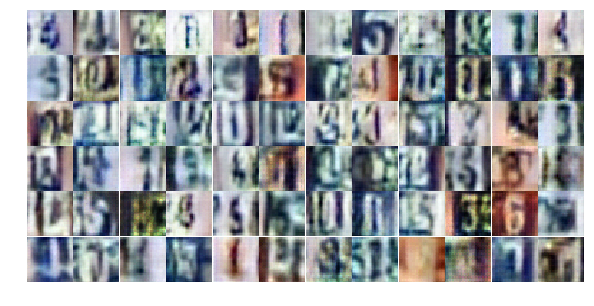

Epoch 17/25... Discriminator Loss: 1.1744... Generator Loss: 0.8617
Epoch 17/25... Discriminator Loss: 1.1433... Generator Loss: 0.9381
Epoch 17/25... Discriminator Loss: 1.1919... Generator Loss: 0.8671
Epoch 17/25... Discriminator Loss: 1.1123... Generator Loss: 0.9181
Epoch 17/25... Discriminator Loss: 1.1999... Generator Loss: 0.8616
Epoch 17/25... Discriminator Loss: 1.1613... Generator Loss: 1.1210
Epoch 17/25... Discriminator Loss: 1.2521... Generator Loss: 0.8772
Epoch 17/25... Discriminator Loss: 1.1511... Generator Loss: 0.8278
Epoch 17/25... Discriminator Loss: 1.0937... Generator Loss: 0.9028
Epoch 17/25... Discriminator Loss: 1.1578... Generator Loss: 0.8577


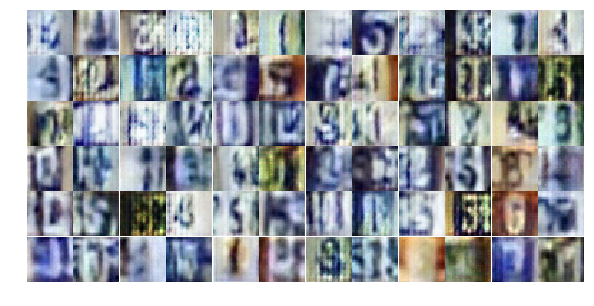

Epoch 17/25... Discriminator Loss: 1.2171... Generator Loss: 0.9356
Epoch 17/25... Discriminator Loss: 1.1722... Generator Loss: 0.9477
Epoch 17/25... Discriminator Loss: 1.0721... Generator Loss: 0.8621
Epoch 17/25... Discriminator Loss: 1.1268... Generator Loss: 0.8551
Epoch 17/25... Discriminator Loss: 1.0026... Generator Loss: 1.0029
Epoch 17/25... Discriminator Loss: 1.1389... Generator Loss: 0.8224
Epoch 17/25... Discriminator Loss: 1.1998... Generator Loss: 0.8238
Epoch 17/25... Discriminator Loss: 1.0697... Generator Loss: 1.0256
Epoch 17/25... Discriminator Loss: 1.0867... Generator Loss: 0.8953
Epoch 17/25... Discriminator Loss: 1.1095... Generator Loss: 0.9873


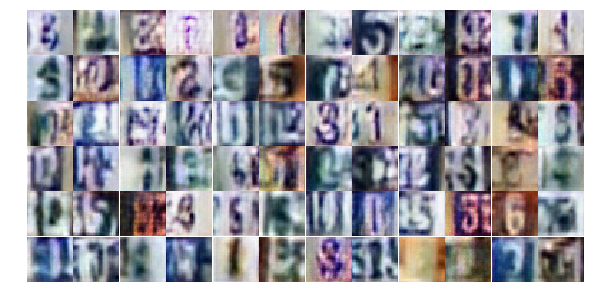

Epoch 17/25... Discriminator Loss: 1.1945... Generator Loss: 0.9941
Epoch 17/25... Discriminator Loss: 1.1368... Generator Loss: 1.0114
Epoch 17/25... Discriminator Loss: 1.1658... Generator Loss: 0.8545
Epoch 17/25... Discriminator Loss: 1.1673... Generator Loss: 0.8768
Epoch 17/25... Discriminator Loss: 1.1930... Generator Loss: 0.8683
Epoch 17/25... Discriminator Loss: 1.1655... Generator Loss: 0.9775
Epoch 17/25... Discriminator Loss: 1.1344... Generator Loss: 0.8716
Epoch 18/25... Discriminator Loss: 1.2484... Generator Loss: 0.9621
Epoch 18/25... Discriminator Loss: 1.2084... Generator Loss: 1.0113
Epoch 18/25... Discriminator Loss: 1.2066... Generator Loss: 0.9580


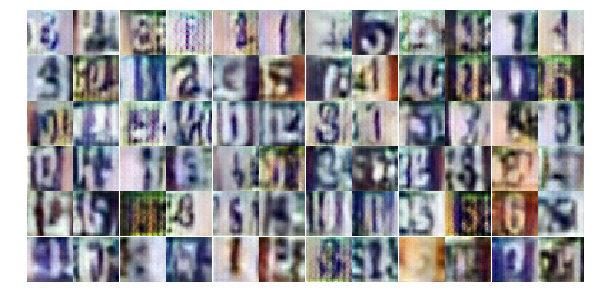

Epoch 18/25... Discriminator Loss: 1.0876... Generator Loss: 0.9094
Epoch 18/25... Discriminator Loss: 1.2358... Generator Loss: 0.8242
Epoch 18/25... Discriminator Loss: 1.1456... Generator Loss: 0.9304
Epoch 18/25... Discriminator Loss: 1.0668... Generator Loss: 0.9984
Epoch 18/25... Discriminator Loss: 1.1866... Generator Loss: 0.7949
Epoch 18/25... Discriminator Loss: 1.0420... Generator Loss: 0.9798
Epoch 18/25... Discriminator Loss: 1.1596... Generator Loss: 0.8252
Epoch 18/25... Discriminator Loss: 1.1574... Generator Loss: 0.9106
Epoch 18/25... Discriminator Loss: 1.1071... Generator Loss: 0.9527
Epoch 18/25... Discriminator Loss: 1.1686... Generator Loss: 0.9233


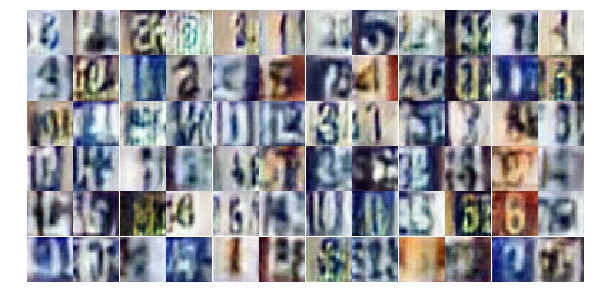

Epoch 18/25... Discriminator Loss: 1.2536... Generator Loss: 0.7439
Epoch 18/25... Discriminator Loss: 1.1876... Generator Loss: 0.9069
Epoch 18/25... Discriminator Loss: 1.1341... Generator Loss: 1.0541
Epoch 18/25... Discriminator Loss: 1.1170... Generator Loss: 0.8720
Epoch 18/25... Discriminator Loss: 1.7518... Generator Loss: 0.5192
Epoch 18/25... Discriminator Loss: 1.2261... Generator Loss: 0.7420
Epoch 18/25... Discriminator Loss: 1.2163... Generator Loss: 0.9615
Epoch 18/25... Discriminator Loss: 1.1117... Generator Loss: 0.9120
Epoch 18/25... Discriminator Loss: 1.1563... Generator Loss: 0.8437
Epoch 18/25... Discriminator Loss: 1.1745... Generator Loss: 0.8093


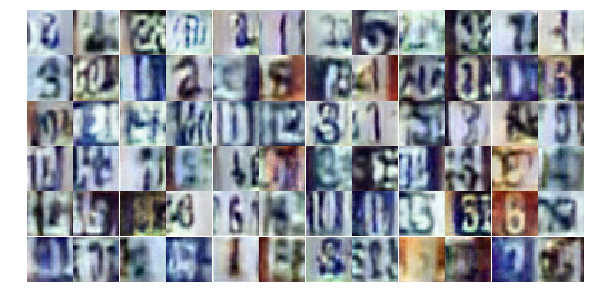

Epoch 18/25... Discriminator Loss: 1.1760... Generator Loss: 0.8004
Epoch 18/25... Discriminator Loss: 1.1203... Generator Loss: 0.9503
Epoch 18/25... Discriminator Loss: 1.0951... Generator Loss: 0.9427
Epoch 18/25... Discriminator Loss: 1.1710... Generator Loss: 0.9236
Epoch 18/25... Discriminator Loss: 1.1509... Generator Loss: 0.9013
Epoch 18/25... Discriminator Loss: 1.1165... Generator Loss: 0.9263
Epoch 19/25... Discriminator Loss: 1.1699... Generator Loss: 0.9659
Epoch 19/25... Discriminator Loss: 1.0791... Generator Loss: 0.9525
Epoch 19/25... Discriminator Loss: 1.2726... Generator Loss: 0.7564
Epoch 19/25... Discriminator Loss: 1.1488... Generator Loss: 0.8648


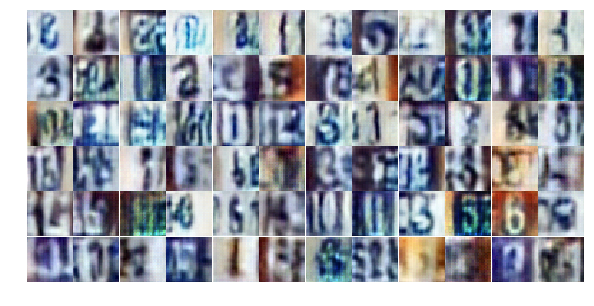

Epoch 19/25... Discriminator Loss: 1.1674... Generator Loss: 0.7581
Epoch 19/25... Discriminator Loss: 1.1894... Generator Loss: 0.7723
Epoch 19/25... Discriminator Loss: 1.1433... Generator Loss: 1.0034
Epoch 19/25... Discriminator Loss: 1.1749... Generator Loss: 0.7678
Epoch 19/25... Discriminator Loss: 1.1949... Generator Loss: 0.9911
Epoch 19/25... Discriminator Loss: 1.1657... Generator Loss: 0.9462
Epoch 19/25... Discriminator Loss: 1.1115... Generator Loss: 0.8075
Epoch 19/25... Discriminator Loss: 1.2369... Generator Loss: 0.8662
Epoch 19/25... Discriminator Loss: 1.1335... Generator Loss: 0.8302
Epoch 19/25... Discriminator Loss: 1.1935... Generator Loss: 0.9441


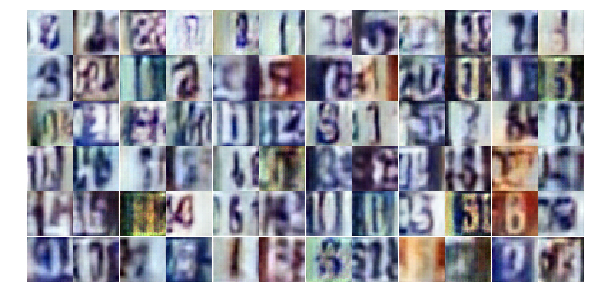

Epoch 19/25... Discriminator Loss: 1.1735... Generator Loss: 0.7834
Epoch 19/25... Discriminator Loss: 1.1710... Generator Loss: 0.9185
Epoch 19/25... Discriminator Loss: 1.1587... Generator Loss: 0.9402
Epoch 19/25... Discriminator Loss: 1.1878... Generator Loss: 0.8713
Epoch 19/25... Discriminator Loss: 1.1375... Generator Loss: 0.7434
Epoch 19/25... Discriminator Loss: 1.1261... Generator Loss: 0.8614
Epoch 19/25... Discriminator Loss: 1.0906... Generator Loss: 0.9723
Epoch 19/25... Discriminator Loss: 1.1187... Generator Loss: 0.8994
Epoch 19/25... Discriminator Loss: 1.0557... Generator Loss: 1.0294
Epoch 19/25... Discriminator Loss: 1.1593... Generator Loss: 0.9285


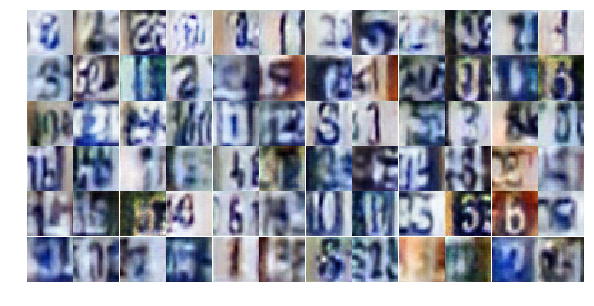

Epoch 19/25... Discriminator Loss: 1.1587... Generator Loss: 0.8443
Epoch 19/25... Discriminator Loss: 1.1830... Generator Loss: 0.8460
Epoch 19/25... Discriminator Loss: 0.9704... Generator Loss: 0.9815
Epoch 19/25... Discriminator Loss: 1.1864... Generator Loss: 0.8932
Epoch 19/25... Discriminator Loss: 1.1632... Generator Loss: 0.8604
Epoch 20/25... Discriminator Loss: 1.1192... Generator Loss: 0.9559
Epoch 20/25... Discriminator Loss: 1.1814... Generator Loss: 0.9295
Epoch 20/25... Discriminator Loss: 1.2515... Generator Loss: 0.8323
Epoch 20/25... Discriminator Loss: 1.1468... Generator Loss: 0.8964
Epoch 20/25... Discriminator Loss: 1.0940... Generator Loss: 0.8975


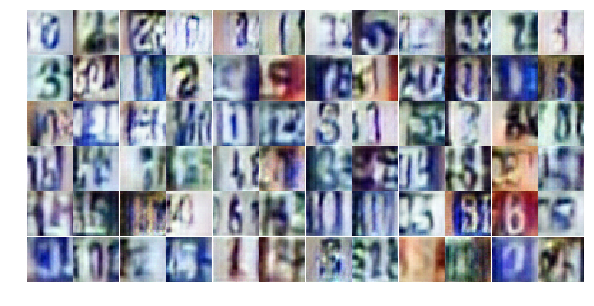

Epoch 20/25... Discriminator Loss: 1.1827... Generator Loss: 0.8902
Epoch 20/25... Discriminator Loss: 1.1074... Generator Loss: 0.8396
Epoch 20/25... Discriminator Loss: 1.1466... Generator Loss: 0.8870
Epoch 20/25... Discriminator Loss: 1.1468... Generator Loss: 0.8402
Epoch 20/25... Discriminator Loss: 1.1321... Generator Loss: 0.9988
Epoch 20/25... Discriminator Loss: 1.0818... Generator Loss: 0.9984
Epoch 20/25... Discriminator Loss: 1.1352... Generator Loss: 0.9559
Epoch 20/25... Discriminator Loss: 1.1670... Generator Loss: 0.8825
Epoch 20/25... Discriminator Loss: 1.0538... Generator Loss: 0.8803
Epoch 20/25... Discriminator Loss: 1.0060... Generator Loss: 0.8916


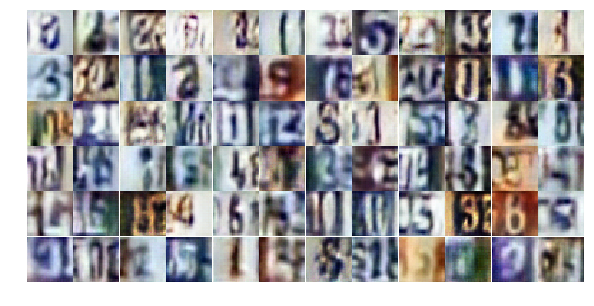

Epoch 20/25... Discriminator Loss: 1.1171... Generator Loss: 0.9119
Epoch 20/25... Discriminator Loss: 1.1598... Generator Loss: 0.8901
Epoch 20/25... Discriminator Loss: 1.2102... Generator Loss: 0.9781
Epoch 20/25... Discriminator Loss: 1.1165... Generator Loss: 0.9003
Epoch 20/25... Discriminator Loss: 1.1970... Generator Loss: 0.9210
Epoch 20/25... Discriminator Loss: 1.1579... Generator Loss: 0.9036
Epoch 20/25... Discriminator Loss: 1.1456... Generator Loss: 0.8637
Epoch 20/25... Discriminator Loss: 1.1797... Generator Loss: 0.9513
Epoch 20/25... Discriminator Loss: 1.1912... Generator Loss: 0.8679
Epoch 20/25... Discriminator Loss: 1.1403... Generator Loss: 0.9791


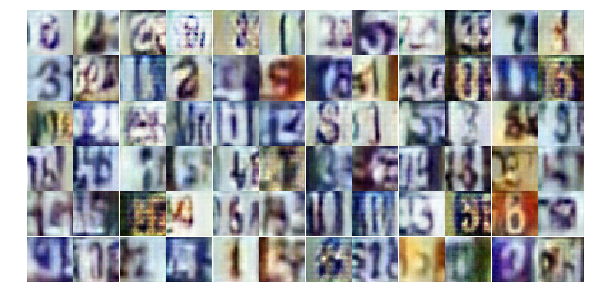

Epoch 20/25... Discriminator Loss: 1.1405... Generator Loss: 0.9044
Epoch 20/25... Discriminator Loss: 1.2020... Generator Loss: 0.8524
Epoch 20/25... Discriminator Loss: 1.1191... Generator Loss: 0.8898
Epoch 20/25... Discriminator Loss: 0.9837... Generator Loss: 0.9827
Epoch 21/25... Discriminator Loss: 1.1585... Generator Loss: 0.9181
Epoch 21/25... Discriminator Loss: 1.1846... Generator Loss: 0.8423
Epoch 21/25... Discriminator Loss: 1.2071... Generator Loss: 0.8945
Epoch 21/25... Discriminator Loss: 1.0778... Generator Loss: 0.9515
Epoch 21/25... Discriminator Loss: 1.0768... Generator Loss: 1.0534
Epoch 21/25... Discriminator Loss: 1.2389... Generator Loss: 0.7445


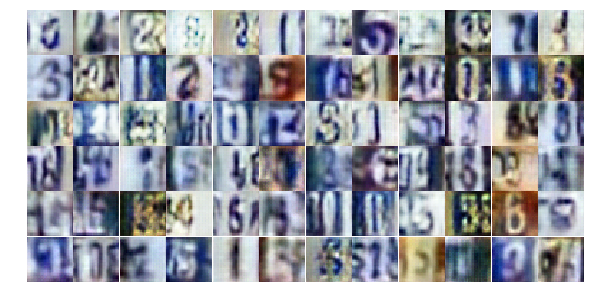

Epoch 21/25... Discriminator Loss: 1.1575... Generator Loss: 0.9879
Epoch 21/25... Discriminator Loss: 1.0350... Generator Loss: 0.9208
Epoch 21/25... Discriminator Loss: 1.1773... Generator Loss: 0.9965
Epoch 21/25... Discriminator Loss: 1.1559... Generator Loss: 0.9253
Epoch 21/25... Discriminator Loss: 1.1308... Generator Loss: 0.8948
Epoch 21/25... Discriminator Loss: 1.1492... Generator Loss: 0.8784
Epoch 21/25... Discriminator Loss: 1.1774... Generator Loss: 0.7807
Epoch 21/25... Discriminator Loss: 1.1868... Generator Loss: 0.7052
Epoch 21/25... Discriminator Loss: 1.1960... Generator Loss: 0.8332
Epoch 21/25... Discriminator Loss: 1.2634... Generator Loss: 1.0943


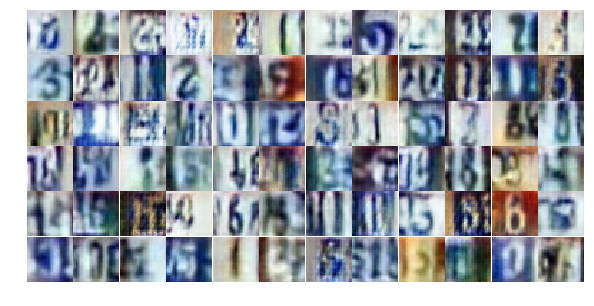

Epoch 21/25... Discriminator Loss: 1.1368... Generator Loss: 0.8623
Epoch 21/25... Discriminator Loss: 1.1644... Generator Loss: 0.9811
Epoch 21/25... Discriminator Loss: 1.0836... Generator Loss: 0.9380
Epoch 21/25... Discriminator Loss: 1.0688... Generator Loss: 0.8986
Epoch 21/25... Discriminator Loss: 1.1948... Generator Loss: 0.8641
Epoch 21/25... Discriminator Loss: 1.1341... Generator Loss: 0.9331
Epoch 21/25... Discriminator Loss: 1.1814... Generator Loss: 0.8812
Epoch 21/25... Discriminator Loss: 1.2272... Generator Loss: 0.8161
Epoch 21/25... Discriminator Loss: 1.2459... Generator Loss: 0.9290
Epoch 21/25... Discriminator Loss: 1.1300... Generator Loss: 0.8845


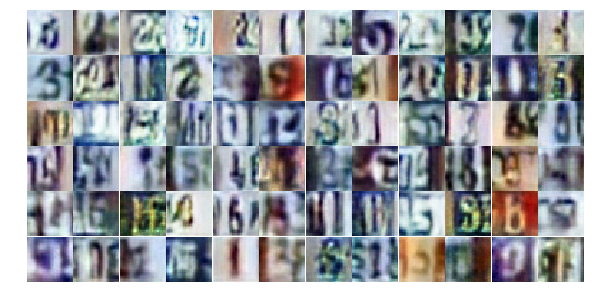

Epoch 21/25... Discriminator Loss: 1.1639... Generator Loss: 0.7644
Epoch 21/25... Discriminator Loss: 1.2388... Generator Loss: 1.0024
Epoch 22/25... Discriminator Loss: 1.1746... Generator Loss: 0.8125
Epoch 22/25... Discriminator Loss: 1.1570... Generator Loss: 0.8994
Epoch 22/25... Discriminator Loss: 1.1857... Generator Loss: 0.8558
Epoch 22/25... Discriminator Loss: 1.1901... Generator Loss: 0.8057
Epoch 22/25... Discriminator Loss: 1.2195... Generator Loss: 0.8892
Epoch 22/25... Discriminator Loss: 1.2275... Generator Loss: 0.9072
Epoch 22/25... Discriminator Loss: 1.1409... Generator Loss: 0.8980
Epoch 22/25... Discriminator Loss: 1.1265... Generator Loss: 0.9678


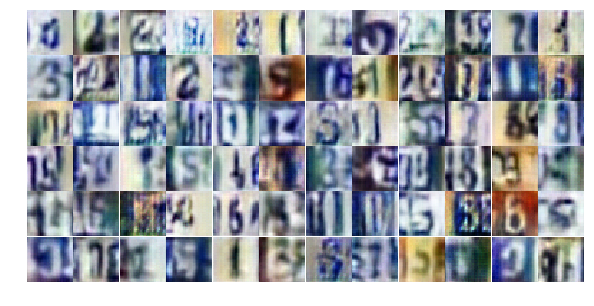

Epoch 22/25... Discriminator Loss: 1.1834... Generator Loss: 0.9061
Epoch 22/25... Discriminator Loss: 1.1987... Generator Loss: 1.0475
Epoch 22/25... Discriminator Loss: 1.2024... Generator Loss: 0.8551
Epoch 22/25... Discriminator Loss: 1.2419... Generator Loss: 0.8401
Epoch 22/25... Discriminator Loss: 1.1494... Generator Loss: 0.7598
Epoch 22/25... Discriminator Loss: 1.2494... Generator Loss: 0.9269
Epoch 22/25... Discriminator Loss: 1.1721... Generator Loss: 0.8042
Epoch 22/25... Discriminator Loss: 1.2237... Generator Loss: 0.8135
Epoch 22/25... Discriminator Loss: 1.1696... Generator Loss: 0.8878
Epoch 22/25... Discriminator Loss: 1.1629... Generator Loss: 0.8857


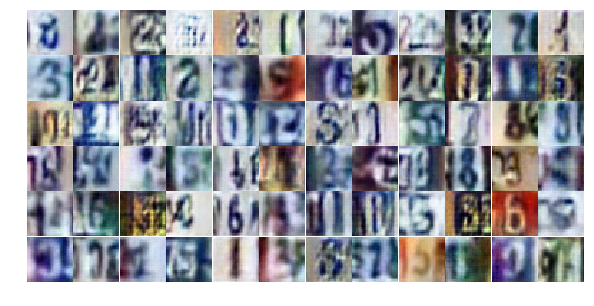

Epoch 22/25... Discriminator Loss: 1.2208... Generator Loss: 0.9509
Epoch 22/25... Discriminator Loss: 1.1755... Generator Loss: 0.8635
Epoch 22/25... Discriminator Loss: 1.1415... Generator Loss: 0.8527
Epoch 22/25... Discriminator Loss: 1.2638... Generator Loss: 0.7540
Epoch 22/25... Discriminator Loss: 1.1675... Generator Loss: 0.9294
Epoch 22/25... Discriminator Loss: 1.0976... Generator Loss: 0.8380
Epoch 22/25... Discriminator Loss: 1.1881... Generator Loss: 0.8280
Epoch 22/25... Discriminator Loss: 1.1647... Generator Loss: 1.0305
Epoch 22/25... Discriminator Loss: 1.1995... Generator Loss: 0.8300
Epoch 22/25... Discriminator Loss: 1.1251... Generator Loss: 1.0267


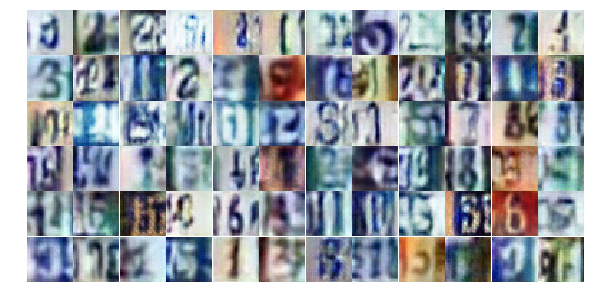

Epoch 22/25... Discriminator Loss: 1.1204... Generator Loss: 0.8738
Epoch 23/25... Discriminator Loss: 1.1830... Generator Loss: 0.7907
Epoch 23/25... Discriminator Loss: 1.2219... Generator Loss: 0.8944
Epoch 23/25... Discriminator Loss: 1.1641... Generator Loss: 0.8020
Epoch 23/25... Discriminator Loss: 1.1497... Generator Loss: 0.7835
Epoch 23/25... Discriminator Loss: 1.2202... Generator Loss: 0.8347
Epoch 23/25... Discriminator Loss: 1.1340... Generator Loss: 0.8897
Epoch 23/25... Discriminator Loss: 1.2093... Generator Loss: 0.8796
Epoch 23/25... Discriminator Loss: 1.1610... Generator Loss: 0.8579
Epoch 23/25... Discriminator Loss: 1.1772... Generator Loss: 0.8081


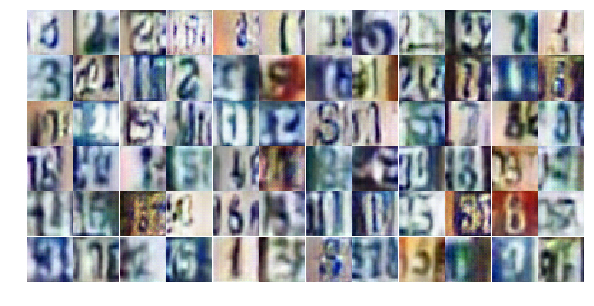

Epoch 23/25... Discriminator Loss: 1.2196... Generator Loss: 0.8504
Epoch 23/25... Discriminator Loss: 1.0953... Generator Loss: 0.9036
Epoch 23/25... Discriminator Loss: 1.1502... Generator Loss: 0.8475
Epoch 23/25... Discriminator Loss: 1.0590... Generator Loss: 1.1422
Epoch 23/25... Discriminator Loss: 1.1799... Generator Loss: 0.7327
Epoch 23/25... Discriminator Loss: 1.1194... Generator Loss: 0.9400
Epoch 23/25... Discriminator Loss: 1.1830... Generator Loss: 0.7974
Epoch 23/25... Discriminator Loss: 1.1484... Generator Loss: 1.1034
Epoch 23/25... Discriminator Loss: 1.2350... Generator Loss: 0.8858
Epoch 23/25... Discriminator Loss: 1.1969... Generator Loss: 0.8580


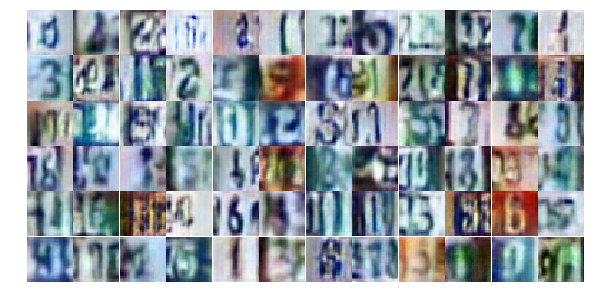

Epoch 23/25... Discriminator Loss: 1.1755... Generator Loss: 0.8209
Epoch 23/25... Discriminator Loss: 1.1930... Generator Loss: 0.8600
Epoch 23/25... Discriminator Loss: 1.2427... Generator Loss: 0.6846
Epoch 23/25... Discriminator Loss: 1.1047... Generator Loss: 0.8812
Epoch 23/25... Discriminator Loss: 1.1682... Generator Loss: 0.8923
Epoch 23/25... Discriminator Loss: 1.1742... Generator Loss: 0.8350
Epoch 23/25... Discriminator Loss: 1.1884... Generator Loss: 0.7860
Epoch 23/25... Discriminator Loss: 1.1638... Generator Loss: 0.9801
Epoch 23/25... Discriminator Loss: 1.0985... Generator Loss: 0.8553
Epoch 23/25... Discriminator Loss: 1.2026... Generator Loss: 0.8974


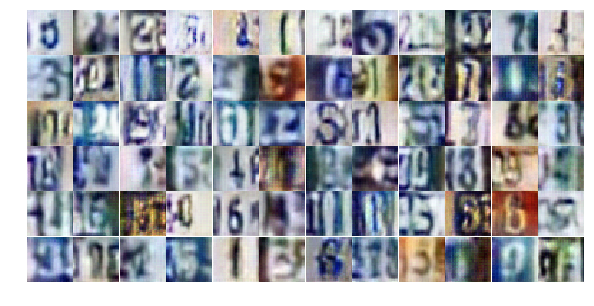

Epoch 24/25... Discriminator Loss: 1.1740... Generator Loss: 1.0253
Epoch 24/25... Discriminator Loss: 1.1997... Generator Loss: 0.8675
Epoch 24/25... Discriminator Loss: 1.0922... Generator Loss: 0.8674
Epoch 24/25... Discriminator Loss: 1.1134... Generator Loss: 0.9492
Epoch 24/25... Discriminator Loss: 1.1910... Generator Loss: 0.8955
Epoch 24/25... Discriminator Loss: 1.2804... Generator Loss: 1.0067
Epoch 24/25... Discriminator Loss: 1.1927... Generator Loss: 0.9927
Epoch 24/25... Discriminator Loss: 1.2026... Generator Loss: 0.6997
Epoch 24/25... Discriminator Loss: 1.1358... Generator Loss: 0.7627
Epoch 24/25... Discriminator Loss: 1.2295... Generator Loss: 0.7790


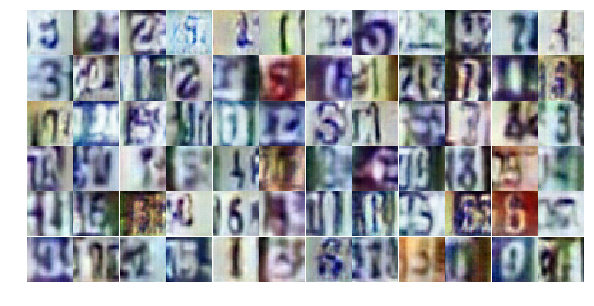

Epoch 24/25... Discriminator Loss: 1.1808... Generator Loss: 0.9967
Epoch 24/25... Discriminator Loss: 1.1750... Generator Loss: 0.8086
Epoch 24/25... Discriminator Loss: 1.2280... Generator Loss: 1.0126
Epoch 24/25... Discriminator Loss: 1.1651... Generator Loss: 1.0530
Epoch 24/25... Discriminator Loss: 1.1493... Generator Loss: 0.8677
Epoch 24/25... Discriminator Loss: 1.2590... Generator Loss: 0.7640
Epoch 24/25... Discriminator Loss: 1.1558... Generator Loss: 0.8590
Epoch 24/25... Discriminator Loss: 1.2151... Generator Loss: 0.9558
Epoch 24/25... Discriminator Loss: 1.1834... Generator Loss: 0.8531
Epoch 24/25... Discriminator Loss: 1.0915... Generator Loss: 0.8534


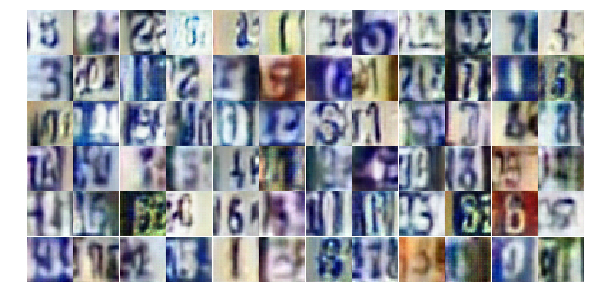

Epoch 24/25... Discriminator Loss: 1.1621... Generator Loss: 0.9051
Epoch 24/25... Discriminator Loss: 1.1856... Generator Loss: 0.9394
Epoch 24/25... Discriminator Loss: 1.1925... Generator Loss: 0.9535
Epoch 24/25... Discriminator Loss: 1.1538... Generator Loss: 0.8199
Epoch 24/25... Discriminator Loss: 1.1575... Generator Loss: 0.9095
Epoch 24/25... Discriminator Loss: 1.1778... Generator Loss: 0.9198
Epoch 24/25... Discriminator Loss: 1.1978... Generator Loss: 0.8471
Epoch 24/25... Discriminator Loss: 1.1308... Generator Loss: 1.0777
Epoch 25/25... Discriminator Loss: 1.1836... Generator Loss: 0.8392
Epoch 25/25... Discriminator Loss: 1.1781... Generator Loss: 0.8339


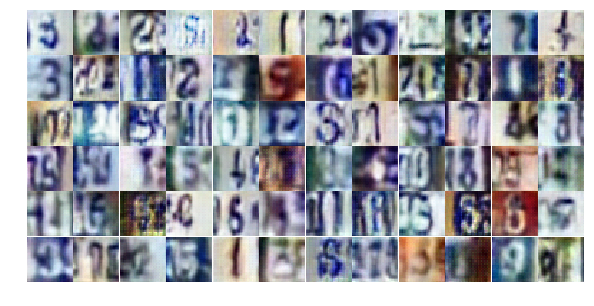

Epoch 25/25... Discriminator Loss: 1.1436... Generator Loss: 0.8617
Epoch 25/25... Discriminator Loss: 1.1743... Generator Loss: 0.8382
Epoch 25/25... Discriminator Loss: 1.1702... Generator Loss: 0.8812
Epoch 25/25... Discriminator Loss: 1.1786... Generator Loss: 0.9727
Epoch 25/25... Discriminator Loss: 1.1491... Generator Loss: 0.8636
Epoch 25/25... Discriminator Loss: 1.1798... Generator Loss: 1.1083
Epoch 25/25... Discriminator Loss: 1.2020... Generator Loss: 0.7983
Epoch 25/25... Discriminator Loss: 1.1945... Generator Loss: 0.8462
Epoch 25/25... Discriminator Loss: 1.2211... Generator Loss: 0.7427
Epoch 25/25... Discriminator Loss: 1.1543... Generator Loss: 0.8489


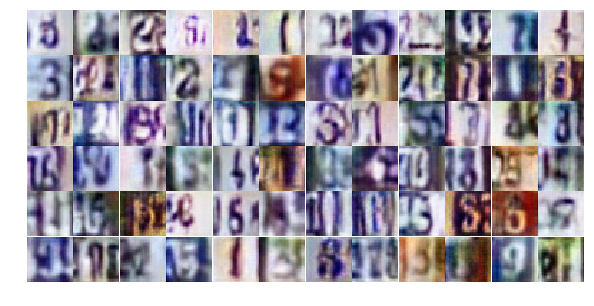

Epoch 25/25... Discriminator Loss: 1.0994... Generator Loss: 0.9630
Epoch 25/25... Discriminator Loss: 1.1827... Generator Loss: 0.9111
Epoch 25/25... Discriminator Loss: 1.1875... Generator Loss: 0.9020
Epoch 25/25... Discriminator Loss: 1.1403... Generator Loss: 0.9678
Epoch 25/25... Discriminator Loss: 1.1957... Generator Loss: 0.9351
Epoch 25/25... Discriminator Loss: 1.3005... Generator Loss: 0.8079
Epoch 25/25... Discriminator Loss: 1.2172... Generator Loss: 0.8335
Epoch 25/25... Discriminator Loss: 1.1610... Generator Loss: 0.9020
Epoch 25/25... Discriminator Loss: 1.1610... Generator Loss: 0.7917
Epoch 25/25... Discriminator Loss: 1.1770... Generator Loss: 0.8776


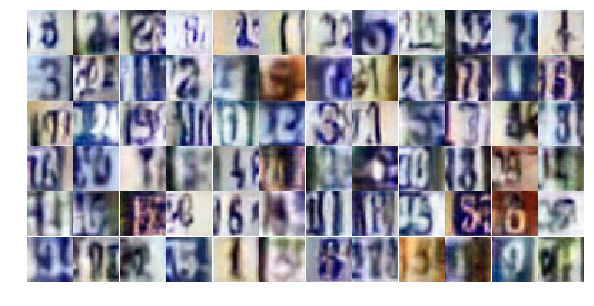

Epoch 25/25... Discriminator Loss: 1.1709... Generator Loss: 1.0416
Epoch 25/25... Discriminator Loss: 1.1333... Generator Loss: 1.0407
Epoch 25/25... Discriminator Loss: 1.1395... Generator Loss: 0.9171
Epoch 25/25... Discriminator Loss: 1.0604... Generator Loss: 0.9263
Epoch 25/25... Discriminator Loss: 1.1293... Generator Loss: 0.8774
Epoch 25/25... Discriminator Loss: 1.1596... Generator Loss: 0.9786
Epoch 25/25... Discriminator Loss: 1.1673... Generator Loss: 0.9738


In [26]:
# Load the data and train the network here
dataset = Dataset(trainset, testset)
losses, samples = train(net, dataset, epochs, batch_size, figsize=(10,5))

In [ ]:
fig, ax = plt.subplots()
losses = np.array(losses)
plt.plot(losses.T[0], label='Discriminator', alpha=0.5)
plt.plot(losses.T[1], label='Generator', alpha=0.5)
plt.title("Training Losses")
plt.legend()

In [ ]:
_ = view_samples(-1, samples, 6, 12, figsize=(10,5))